<h1> <center> Transcriptomics of symptomatic hosts, potato and mint,$\\$ and asymptomatic host, mustard, during infection with host-adapted isolates of $Verticillim\; dahliae$ </center></h1>         

#### <h1> Authors: David Linnard Wheeler | Jeness Scott | Jeremiah Kam Sung Dung | Dennis Johnson </h1>         

## Table of Contents: <a class="anchor" id="toc-q"></a>
* [Objectives](#first-q)
* [Hypotheses](#second-q)
* [Experimental design](#third-q)
* [Material and Methods](#fourth-q)
* [Open data](#fifth-q)
* [Curate data](#sixth-q)
* [Summary statistics](#seventh-q)
* [Exploratory data analyses](#eighth-q)
* [Diagnostics](#nineth-q)
* [Parametric analyses: differential expression analysis](#tenth-q)
* [Visualization](#eleventh-q)
* [Export data](#twelveth-q)
* [Graveyard](#thirteenth-q)
* [Resources](#fourteenth-q)

### Objectives <a class="anchor" id="first-q"></a>  
[Back to Table of Contents](#toc-q)

* Characterize the differentially expressed genes involved in symptomatic (potato and mint) and asymptomatic interactions (mustard) between hosts and $Verticillium\; dahliae$ 

### Hypotheses <a class="anchor" id="second-q"></a>  
[Back to Table of Contents](#toc-q)

* **Science $H_o$ 1**: There are no differentially expressed genes (i) between symptomatic and asymptomatic hosts, (ii) between isolates within a host, and (iii) between hosts within an isolate.
* **Science $H_o$ 2**: Symptomatic and asymptomatic hosts exhibit similar responses to $V.\; dahliae$ infection
* **Science $H_o$ 3**: Gene expression of $V.\;dahliae$ does not differ accross fungal strains or between asymptomatic and symptomatic hosts
* **Statistical $H_o$**: 
    * Observed variation in DEG across treatments represents random variation, not systematic effects of hosts or isolates Variation in the DEG is unrelated to variation in the hosts and isolates and is no greater than expected by chance or sampling error.
    * More formally:
    
    $K_{ij} \sim NB(\mu_{ij}, \alpha_i)$
    
    where the counts, $K_{ij}$ for each gene, $i$, and sample, $j$, follow a negative binomial with the mean,$\mu_{ij}$, and dispersion parameter for each gene, $\alpha_i$. The dispersion parameter,$\alpha_i$, describes  the relationship between variance of an observed count and its mean value- the expected distance of the observed count from its mean. The mean,$\mu_{ij}$, can be decomposed into a sample-specific size factor, $s_j$, and a parameter,$q_{ij}$, that is proportional to the expected concentation of transcripts for sample $j$:
    
    $\mu_{ij} = s_j q_{ij}$
    
    Log2 fold changes for gene $i$ in each column of the model matrix, $X$,are provided by the coefficients, $\beta_i$:
    
    $log_2(q_{ij}) = x_{j.}\beta_i$
    
    * In short, the effect sizes between the groups are 0.

### Experimental design<a class="anchor" id="third-q"></a>  
[Back to Table of Contents](#toc-q)

* **Treatment structure**: 2 way factorial
    * **Independent variables**: 
        * 3 cultivars:
            1. Potato
            2. Mint
            3. Mustard
        * 3 fungi:
            1. $Verticillium\; dahliae\; 653$
            2. $Verticillium\; dahliae\; 111$
            3. Non-inoculated control
        * 1 time point:
            * 10 days after inoculation
        * 3 replicates
    * **Dependent variables**:
        * Constructs: 
            * Gene expression
        * Variables: 
            * Counts of RNA transcripts
            
* **Design structure**: randomized complete block design    
* **Observational unit**: plant
* **Experimental unit**: plant
* **Samples**: whole plants
* **Data**: 
    * RNA quantity and quality
    * Counts of RNA transcripts
* **Analysis**: 
    * Differential gene expression analyses        

### Materials and Methods<a class="anchor" id="fourth-q"></a>  
[Back to Table of Contents](#toc-q)

**Inoculum preparation for root dips (3.5"pot)**:
- Grow Verticillium dahliae  653 and 111 on separate plates of PDA agar at room temperature/
- Harvest 0.5 cm cores from each plate.
- Add one core per one  200 ml flask filled with 125ml of PDA broth.
- Incubate cultures at room temp/22 C for 7-10 days in the dark.
    - Spin at 125 RPM.
- Filter inoculum through two layers of sterilized cheesecloth with vacuum filter.
- Quantify inoculum with hemocytometer.
- Dilute inoculum to 10^6 conidia/mL with sterilized diH20.
- Inoculate via root drench. 
    - Pour 100 mL of 10^6 conidia/mL inoculum over the soil/turface surface.
    - I did this mostly in lieu of watering. For example, if you normally give the plants 100 mL of water/day, give them 0 mL of water and inoculate; if you normally give the plants 200 mL of water/day, give them 100mL of water and inoculate.
_____________________________________________
* Inoculum for isolates 653 and 111:
   * 180 plants/3 isolates = 60 plants/isolate * 100 ml/plant (Dung et al. 2010) = 6000 ml = 6 L inoculum
   * 6 L of 10$^6$ conidia/ml inoculum is needed
   * 6 L/200 ml/flask = 30 flasks 

* Trial one planted: 5/1/2018
* Trial one inoculated: 5/19/2018
* First Harvest: potato, mint, and mustards harvested @ 10 dpi on 5/29/2018

### Open data<a class="anchor" id="fifth-q"></a>  
[Back to Table of Contents](#toc-q)

* **Install and invoke packages**

In [1]:
if (!requireNamespace("BiocManager", quietly = TRUE))
    install.packages("BiocManager")
BiocManager::install("DEFormats", version = "3.8")

ERROR: Error: Bioconductor version '3.8' requires R version '3.5'; see
  https://bioconductor.org/install


In [2]:
if (!requireNamespace("BiocManager", quietly = TRUE))
    install.packages("BiocManager")
BiocManager::install("apeglm", version = "3.8")

ERROR: Error: Bioconductor version '3.8' requires R version '3.5'; see
  https://bioconductor.org/install


In [1]:
library("data.table")
library("tibble")
library("eulerr")
library("apeglm")
library("DESeq2")
library("edgeR")
library("DEFormats")
library("dplyr")
library("ggplot2")
library("reshape2")
library("pheatmap")
library("RColorBrewer")
library("PoiClaClu")
library("ggbeeswarm")
library("EnhancedVolcano")
library("devtools")
library("gridExtra")
library("grid")
library("cowplot")
library("genefilter")
library("viridis")
library("VennDiagram")
library("prob")
library("seqinr")
library("stringr")
library("stringi")
library("tidyverse")

Warning message:
“package ‘apeglm’ was built under R version 4.0.3”
Warning message:
“package ‘DESeq2’ was built under R version 4.0.3”
Loading required package: S4Vectors

Warning message:
“package ‘S4Vectors’ was built under R version 4.0.3”
Loading required package: stats4

Loading required package: BiocGenerics

Warning message:
“package ‘BiocGenerics’ was built under R version 4.0.3”
Loading required package: parallel


Attaching package: ‘BiocGenerics’


The following objects are masked from ‘package:parallel’:

    clusterApply, clusterApplyLB, clusterCall, clusterEvalQ,
    clusterExport, clusterMap, parApply, parCapply, parLapply,
    parLapplyLB, parRapply, parSapply, parSapplyLB


The following objects are masked from ‘package:stats’:

    IQR, mad, sd, var, xtabs


The following objects are masked from ‘package:base’:

    anyDuplicated, append, as.data.frame, basename, cbind, colnames,
    dirname, do.call, duplicated, eval, evalq, Filter, Find, get, grep,
    grepl, inter

Error in get(genname, envir = envir) : object 'testthat_print' not found



Attaching package: ‘gridExtra’


The following object is masked from ‘package:dplyr’:

    combine


The following object is masked from ‘package:Biobase’:

    combine


The following object is masked from ‘package:BiocGenerics’:

    combine


Warning message:
“package ‘genefilter’ was built under R version 4.0.3”

Attaching package: ‘genefilter’


The following objects are masked from ‘package:MatrixGenerics’:

    rowSds, rowVars


The following objects are masked from ‘package:matrixStats’:

    rowSds, rowVars


Loading required package: viridisLite

Loading required package: futile.logger

Loading required package: combinat


Attaching package: ‘combinat’


The following object is masked from ‘package:utils’:

    combn


Loading required package: fAsianOptions

Loading required package: timeDate

Loading required package: timeSeries


Attaching package: ‘timeSeries’


The following object is masked from ‘package:Biobase’:

    description


The following objects are masked fro

* Grab working directory

In [2]:
getwd()

[1] "/Users/davidwheeler/Desktop/RESEARCH/Projects/RNA-seq/RNA seq/SCRIPTS"

* Set working directory

In [3]:
setwd("/Users/davidwheeler/Desktop/RESEARCH/Projects/TRANSCRIPTOMICS/DATA/R_FILES/Reads/")

* **Open data**

Fragments

In [4]:
DF = read.csv("Mentha_reads.csv",header=T)

Gene names

In [5]:
gnDF = read.csv("/Users/davidwheeler/Desktop/RESEARCH/Projects/TRANSCRIPTOMICS/DATA/R_FILES/Gene_names/DGE_GENE_NAME/Mentha_DEG_genename.csv",
                header=T)


In [6]:
names(gnDF)[2]<-"id"
names(gnDF)[3]<-"Comparison"
names(gnDF)[6]<-"KO.Name"
names(gnDF)[10]<-"Hit1_acc"

Sequences

In [7]:
fastafile <- read.fasta(file = "/Users/davidwheeler/Desktop/RESEARCH/Projects/TRANSCRIPTOMICS/DATA/R_FILES/Sequences/Mint_unigene.fasta", 
                       seqtype = "AA",as.string = TRUE, set.attributes = FALSE)


Gene ontology

In [8]:
GO = read.csv("/Users/davidwheeler/Desktop/RESEARCH/Projects/TRANSCRIPTOMICS/DATA/R_FILES/Gene_ontology/Mentha_Annotation_GO.csv",
                header=T)


### Curate data<a class="anchor" id="sixth-q"></a>  
[Back to Table of Contents](#toc-q)

* **Set first column to index**

In [9]:
DF_1 <- data.frame(DF[,-1], row.names = DF[,1])

In [10]:
head(DF_1)

,S2_3_2_1,S2_3_2_9,S2_3_2_4,S2_1_2_1,S2_1_2_4,S2_1_2_5,S2_2_2_2,S2_2_2_5,S2_2_2_9
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Cluster-67248.142691,4.03,0.00,0.00,3.72,2.16,1.92,0.00,8.79,14.92
Cluster-67248.107952,106.65,67.52,77.12,161.88,114.64,188.30,176.11,144.88,235.24
Cluster-58782.0,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,4.00
Cluster-67248.152869,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
Cluster-67248.17374,143.91,112.02,101.26,253.87,162.03,236.01,226.94,263.46,162.22
Cluster-67248.56631,2.31,7.86,6.27,11.81,3.72,0.00,4.92,0.00,0.00


* **Rounds floats/decimals to integer counts: since these data were generated $de\; novo$ decimals are abound**

In [11]:
DF = round(DF_1, digits = 0)

* **Create DGEList Object**

> * Convert dataframe to matrix

In [12]:
df = data.matrix(DF)

* **Vector for column/treatment names**

In [13]:
group = rep(c("Control", "653", "111"), each = 3)

In [14]:
dge = DGEList(df, group = group)

In [15]:
dge

,S2_3_2_1,S2_3_2_9,S2_3_2_4,S2_1_2_1,S2_1_2_4,S2_1_2_5,S2_2_2_2,S2_2_2_5,S2_2_2_9
Cluster-67248.142691,4,0,0,4,2,2,0,9,15
Cluster-67248.107952,107,68,77,162,115,188,176,145,235
Cluster-58782.0,0,1,0,0,0,0,0,0,4
Cluster-67248.152869,0,0,0,0,0,0,0,0,0
Cluster-67248.17374,144,112,101,254,162,236,227,263,162
Cluster-67248.56631,2,8,6,12,4,0,5,0,0
Cluster-73865.0,0,3,0,7,6,6,0,3,0
Cluster-4147.0,0,68,0,0,0,0,0,0,0
Cluster-67248.24568,4,7,3,6,9,8,5,9,4
Cluster-67248.86688,0,4,0,2,0,2,0,0,0


* **Coerce DGElist to DESeqDataSet**

In [16]:
dds = as.DESeqDataSet(dge)

converting counts to integer mode

  it appears that the last variable in the design formula, 'group',
  has a factor level, 'Control', which is not the reference level. we recommend
  to use factor(...,levels=...) or relevel() to set this as the reference level
  before proceeding. for more information, please see the 'Note on factor levels'
  in vignette('DESeq2').



In [17]:
dds

class: DESeqDataSet 
dim: 266009 9 
metadata(1): version
assays(1): counts
rownames(266009): Cluster-67248.142691 Cluster-67248.107952 ...
  Cluster-67248.27096 Cluster-67248.132887
rowData names(0):
colnames(9): S2_3_2_1 S2_3_2_9 ... S2_2_2_5 S2_2_2_9
colData names(3): group lib.size norm.factors

**Gene names data**

Subset data

In [18]:
gnDF = gnDF[,c("id","Comparison","KO.Name","Hit1_acc")]

### Summary Statistics<a class="anchor" id="seventh-q"></a>  
[Back to Table of Contents](#toc-q)

**The total number of DEGS per comparison**

In [87]:
table(DEGS$Comparison)


653v111   Cv111   Cv653 
     99    1551     184 

Tabulate DEG data (Comparison - basemean -direction of regulation - log$_2$-fold change - $p$-value - adjusted $p$-value - gene name - function)

**DEGs from 653 vs Control**

In [88]:
Cv653_gn = subset(Cv653_GeneNames, Comparison == "Cv653")

* Remove DEGS/rows from humans

In [89]:
Cv653_gn = Cv653_gn[!grepl("HUMAN", Cv653_gn$Hit1_acc ),]

- Order genes by fold change

In [90]:
table_cv6 <- (Cv653_gn[order((-Cv653_gn$log2FoldChange)),c(8,1,2,3,6,7,10)])

ERROR: Error in `[.data.frame`(Cv653_gn, order((-Cv653_gn$log2FoldChange)), c(8, : undefined columns selected


- Round digits

In [92]:
table_cv6$baseMean <- round(table_cv6$baseMean, 1)
table_cv6$log2FoldChange <- round(table_cv6$log2FoldChange, 1)
table_cv6$pvalue <- round(table_cv6$pvalue, 7)
table_cv6$padj <- round(table_cv6$padj, 7)

- Format columns

> - Comparison

In [93]:
table_cv6$Comparison = "653 vs control"

> - Host

In [94]:
table_cv6$Host = "Mentha x piperita"

> - Gene function

In [95]:
table_cv6$Function = NA

> * Sequence

In [96]:
table_cv6$Sequence = NA

 - Reorder columns

In [97]:
table_cv6 = table_cv6[,c(8,1,3:7,2,9:10)]

- Grab top 5 genes

In [98]:
Up_cv6 = head(table_cv6,n=5)

> - Add column for regulation status

In [99]:
Up_cv6$Regulation = "up"

- Grab botton 5 genes

In [100]:
Down_cv6 = tail(table_cv6,n=5)

> - Add column for regulation status

In [101]:
Down_cv6$Regulation = "down"

- Table for control vs 653

In [102]:
Table_cv6 = rbind(Up_cv6,Down_cv6)

In [103]:
Table_cv6 

,Host,Comparison,baseMean,log2FoldChange,pvalue,padj,Hit1_acc,id,Function,Sequence,Regulation
1006,Mentha x piperita,653 vs control,124.3,3.5,0e+00,0.0000000,FB30_ARATH,Cluster-67248.41609,NA,NA,up
1411,Mentha x piperita,653 vs control,41.0,3.5,0e+00,0.0000001,PMTK_ARATH,Cluster-67248.84245,NA,NA,up
764,Mentha x piperita,653 vs control,20.3,2.8,3e-07,0.0002652,-,Cluster-67248.142094,NA,NA,up
1821,Mentha x piperita,653 vs control,21.3,2.3,0e+00,0.0000221,-,Cluster-71973.0,NA,NA,up
446,Mentha x piperita,653 vs control,79.7,2.3,0e+00,0.0000002,PER45_ARATH,Cluster-67248.115536,NA,NA,up
1747,Mentha x piperita,653 vs control,19.3,-3.2,0e+00,0.0000004,CB21_SINAL,Cluster-67248.98511,NA,NA,down
544,Mentha x piperita,653 vs control,90.7,-3.6,0e+00,0.0000000,ARP3_ARATH,Cluster-67248.121974,NA,NA,down
49,Mentha x piperita,653 vs control,28.4,-3.8,0e+00,0.0000000,RBS2_BRANA,Cluster-6227.0,NA,NA,down
1017,Mentha x piperita,653 vs control,114.4,-6.1,0e+00,0.0000000,RBS2_BRANA,Cluster-67248.4354,NA,NA,down
1174,Mentha x piperita,653 vs control,203.0,-6.3,0e+00,0.0000000,CNGC5_ARATH,Cluster-67248.65881,NA,NA,down


* Rearrange columns

In [104]:
Table_cv6 = Table_cv6[,c(1:2,11,3:10)]

In [105]:
Table_cv6

,Host,Comparison,Regulation,baseMean,log2FoldChange,pvalue,padj,Hit1_acc,id,Function,Sequence
1006,Mentha x piperita,653 vs control,up,124.3,3.5,0e+00,0.0000000,FB30_ARATH,Cluster-67248.41609,NA,NA
1411,Mentha x piperita,653 vs control,up,41.0,3.5,0e+00,0.0000001,PMTK_ARATH,Cluster-67248.84245,NA,NA
764,Mentha x piperita,653 vs control,up,20.3,2.8,3e-07,0.0002652,-,Cluster-67248.142094,NA,NA
1821,Mentha x piperita,653 vs control,up,21.3,2.3,0e+00,0.0000221,-,Cluster-71973.0,NA,NA
446,Mentha x piperita,653 vs control,up,79.7,2.3,0e+00,0.0000002,PER45_ARATH,Cluster-67248.115536,NA,NA
1747,Mentha x piperita,653 vs control,down,19.3,-3.2,0e+00,0.0000004,CB21_SINAL,Cluster-67248.98511,NA,NA
544,Mentha x piperita,653 vs control,down,90.7,-3.6,0e+00,0.0000000,ARP3_ARATH,Cluster-67248.121974,NA,NA
49,Mentha x piperita,653 vs control,down,28.4,-3.8,0e+00,0.0000000,RBS2_BRANA,Cluster-6227.0,NA,NA
1017,Mentha x piperita,653 vs control,down,114.4,-6.1,0e+00,0.0000000,RBS2_BRANA,Cluster-67248.4354,NA,NA
1174,Mentha x piperita,653 vs control,down,203.0,-6.3,0e+00,0.0000000,CNGC5_ARATH,Cluster-67248.65881,NA,NA


* Rename column headers

In [106]:
names(Table_cv6)[4] = "Base mean"
names(Table_cv6)[5] = "Log2 fold change"
names(Table_cv6)[6] = "p-value"
names(Table_cv6)[7] = "adjusted p-value"
names(Table_cv6)[8] = "Gene name"
names(Table_cv6)[9] = "Gene ID"
names(Table_cv6)[10] = "Function"
names(Table_cv6)[11] = "Sequence"

In [107]:
Table_cv6

,Host,Comparison,Regulation,Base mean,Log2 fold change,p-value,adjusted p-value,Gene name,Gene ID,Function,Sequence
1006,Mentha x piperita,653 vs control,up,124.3,3.5,0e+00,0.0000000,FB30_ARATH,Cluster-67248.41609,NA,NA
1411,Mentha x piperita,653 vs control,up,41.0,3.5,0e+00,0.0000001,PMTK_ARATH,Cluster-67248.84245,NA,NA
764,Mentha x piperita,653 vs control,up,20.3,2.8,3e-07,0.0002652,-,Cluster-67248.142094,NA,NA
1821,Mentha x piperita,653 vs control,up,21.3,2.3,0e+00,0.0000221,-,Cluster-71973.0,NA,NA
446,Mentha x piperita,653 vs control,up,79.7,2.3,0e+00,0.0000002,PER45_ARATH,Cluster-67248.115536,NA,NA
1747,Mentha x piperita,653 vs control,down,19.3,-3.2,0e+00,0.0000004,CB21_SINAL,Cluster-67248.98511,NA,NA
544,Mentha x piperita,653 vs control,down,90.7,-3.6,0e+00,0.0000000,ARP3_ARATH,Cluster-67248.121974,NA,NA
49,Mentha x piperita,653 vs control,down,28.4,-3.8,0e+00,0.0000000,RBS2_BRANA,Cluster-6227.0,NA,NA
1017,Mentha x piperita,653 vs control,down,114.4,-6.1,0e+00,0.0000000,RBS2_BRANA,Cluster-67248.4354,NA,NA
1174,Mentha x piperita,653 vs control,down,203.0,-6.3,0e+00,0.0000000,CNGC5_ARATH,Cluster-67248.65881,NA,NA


**DEGs from 111 vs Control**

In [108]:
Cv111_gn = subset(Cv111_GeneNames, Comparison == "Cv111")

* Remove DEGs/rows from humans

In [109]:
Cv111_gn = Cv111_gn[!grepl("HUMAN", Cv111_gn$Hit1_acc ),]

- Order genes by fold change

In [110]:
table_cv1 <- (Cv111_gn[order((-Cv111_gn$log2FoldChange)),c(8,1,2,3,6,7,10)])

* Round digits

In [111]:
table_cv1$baseMean <- round(table_cv1$baseMean, 1)
table_cv1$log2FoldChange <- round(table_cv1$log2FoldChange, 1)
table_cv1$pvalue <- round(table_cv1$pvalue, 7)
table_cv1$padj <- round(table_cv1$padj, 7)

* Format columns

> * Comparisons

In [112]:
table_cv1$Comparison = "111 vs control"

> * Host

In [113]:
table_cv1$Host = "Mentha x piperita"

> * Gene function

In [114]:
table_cv1$Function = NA

> * Sequence

In [115]:
table_cv1$Sequence = NA

- Reorder columns

In [116]:
table_cv1 = table_cv1[,c(8,1,3:7,2,9:10)]

- Grab top 5 DEGs

In [117]:
Up_cv1 = head(table_cv1,n=5)

> - Column for regulation status

In [118]:
Up_cv1$Regulation = "up"

- Grab bottom 5 DEGs

In [119]:
Down_cv1 = tail(table_cv1,n=5)

> - Column for regulation status

In [120]:
Down_cv1$Regulation = "down"

- Table for control vs 111

In [121]:
Table_cv1 = rbind(Up_cv1,Down_cv1)

In [122]:
Table_cv1

,Host,Comparison,baseMean,log2FoldChange,pvalue,padj,Hit1_acc,id,Function,Sequence,Regulation
1005,Mentha x piperita,111 vs control,124.3,3.4,0.0e+00,0.0000000,FB30_ARATH,Cluster-67248.41609,NA,NA,up
862,Mentha x piperita,111 vs control,51.3,2.5,0.0e+00,0.0000000,IFRH_ARATH,Cluster-67248.155958,NA,NA,up
395,Mentha x piperita,111 vs control,18.6,2.5,1.5e-06,0.0001704,EGL1_ARATH,Cluster-67248.112206,NA,NA,up
447,Mentha x piperita,111 vs control,79.7,2.4,0.0e+00,0.0000000,PER45_ARATH,Cluster-67248.115536,NA,NA,up
1290,Mentha x piperita,111 vs control,24.4,2.4,0.0e+00,0.0000029,C3H53_ORYSJ,Cluster-67248.76854,NA,NA,up
1746,Mentha x piperita,111 vs control,19.3,-3.2,0.0e+00,0.0000000,CB21_SINAL,Cluster-67248.98511,NA,NA,down
1046,Mentha x piperita,111 vs control,55.2,-3.5,0.0e+00,0.0000000,PNSB3_ARATH,Cluster-67248.50623,NA,NA,down
50,Mentha x piperita,111 vs control,28.4,-3.8,0.0e+00,0.0000001,RBS2_BRANA,Cluster-6227.0,NA,NA,down
1016,Mentha x piperita,111 vs control,114.4,-5.9,0.0e+00,0.0000000,RBS2_BRANA,Cluster-67248.4354,NA,NA,down
1175,Mentha x piperita,111 vs control,203.0,-6.6,0.0e+00,0.0000000,CNGC5_ARATH,Cluster-67248.65881,NA,NA,down


- Rearrange columns

In [123]:
Table_cv1 = Table_cv1[,c(1:2,11,3:10)]

In [124]:
Table_cv1

,Host,Comparison,Regulation,baseMean,log2FoldChange,pvalue,padj,Hit1_acc,id,Function,Sequence
1005,Mentha x piperita,111 vs control,up,124.3,3.4,0.0e+00,0.0000000,FB30_ARATH,Cluster-67248.41609,NA,NA
862,Mentha x piperita,111 vs control,up,51.3,2.5,0.0e+00,0.0000000,IFRH_ARATH,Cluster-67248.155958,NA,NA
395,Mentha x piperita,111 vs control,up,18.6,2.5,1.5e-06,0.0001704,EGL1_ARATH,Cluster-67248.112206,NA,NA
447,Mentha x piperita,111 vs control,up,79.7,2.4,0.0e+00,0.0000000,PER45_ARATH,Cluster-67248.115536,NA,NA
1290,Mentha x piperita,111 vs control,up,24.4,2.4,0.0e+00,0.0000029,C3H53_ORYSJ,Cluster-67248.76854,NA,NA
1746,Mentha x piperita,111 vs control,down,19.3,-3.2,0.0e+00,0.0000000,CB21_SINAL,Cluster-67248.98511,NA,NA
1046,Mentha x piperita,111 vs control,down,55.2,-3.5,0.0e+00,0.0000000,PNSB3_ARATH,Cluster-67248.50623,NA,NA
50,Mentha x piperita,111 vs control,down,28.4,-3.8,0.0e+00,0.0000001,RBS2_BRANA,Cluster-6227.0,NA,NA
1016,Mentha x piperita,111 vs control,down,114.4,-5.9,0.0e+00,0.0000000,RBS2_BRANA,Cluster-67248.4354,NA,NA
1175,Mentha x piperita,111 vs control,down,203.0,-6.6,0.0e+00,0.0000000,CNGC5_ARATH,Cluster-67248.65881,NA,NA


* Rename column headers

In [125]:
names(Table_cv1)[4] = "Base mean"
names(Table_cv1)[5] = "Log2 fold change"
names(Table_cv1)[6] = "p-value"
names(Table_cv1)[7] = "adjusted p-value"
names(Table_cv1)[8] = "Gene name"
names(Table_cv1)[9] = "Gene ID"
names(Table_cv1)[10] = "Function"
names(Table_cv1)[11] = "Sequence"

In [334]:
Table_cv1

,Host,Comparison,Regulation,Base mean,Log2 fold change,p-value,adjusted p-value,Gene name,Gene ID,Function,Sequence
1005,Mentha x piperita,111 vs control,up,124.3,3.4,0.0e+00,0.0000000,FB30_ARATH,Cluster-67248.41609,NA,NA
862,Mentha x piperita,111 vs control,up,51.3,2.5,0.0e+00,0.0000000,IFRH_ARATH,Cluster-67248.155958,NA,NA
395,Mentha x piperita,111 vs control,up,18.6,2.5,1.5e-06,0.0001704,EGL1_ARATH,Cluster-67248.112206,NA,NA
447,Mentha x piperita,111 vs control,up,79.7,2.4,0.0e+00,0.0000000,PER45_ARATH,Cluster-67248.115536,NA,NA
1290,Mentha x piperita,111 vs control,up,24.4,2.4,0.0e+00,0.0000029,C3H53_ORYSJ,Cluster-67248.76854,NA,NA
1746,Mentha x piperita,111 vs control,down,19.3,-3.2,0.0e+00,0.0000000,CB21_SINAL,Cluster-67248.98511,NA,NA
1046,Mentha x piperita,111 vs control,down,55.2,-3.5,0.0e+00,0.0000000,PNSB3_ARATH,Cluster-67248.50623,NA,NA
50,Mentha x piperita,111 vs control,down,28.4,-3.8,0.0e+00,0.0000001,RBS2_BRANA,Cluster-6227.0,NA,NA
1016,Mentha x piperita,111 vs control,down,114.4,-5.9,0.0e+00,0.0000000,RBS2_BRANA,Cluster-67248.4354,NA,NA
1175,Mentha x piperita,111 vs control,down,203.0,-6.6,0.0e+00,0.0000000,CNGC5_ARATH,Cluster-67248.65881,NA,NA


**DEGs from 653 vs 111**

In [127]:
i653v111_gn = subset(i653v111_GeneNames, Comparison == "653v111")

* Remove DEGs/rows from humans

In [128]:
i653v111_gn = i653v111_gn[!grepl("HUMAN", i653v111_gn$Hit1_acc ),]

Remove DEGs/rows from *Xenopus laevis* (African clawed frog)

In [129]:
i653v111_gn = i653v111_gn[!grepl("XENLA", i653v111_gn$Hit1_acc ),]

- Order genes by fold change

In [130]:
table_6v1 <- (i653v111_gn[order((-i653v111_gn$log2FoldChange)),c(8,1,2,3,6,7,10)])

- Round Digits

In [131]:
table_6v1$baseMean <- round(table_6v1$baseMean, 1)
table_6v1$log2FoldChange <- round(table_6v1$log2FoldChange, 1)
table_6v1$pvalue <- round(table_6v1$pvalue, 7)
table_6v1$padj <- round(table_6v1$padj, 7)

- Format columns

> - By Columns

In [132]:
table_6v1$Comparison = "653 vs 111"

> * Host

In [133]:
table_6v1$Host = "Mentha x piperita"

> * Gene function

In [134]:
table_6v1$Function = NA

> * Sequence

In [135]:
table_6v1$Sequence = NA

* Reorder columns

In [136]:
table_6v1 = table_6v1[,c(8,1,3:7,2,9:10)]

- Grab top 5 genes

In [137]:
Up_6v1 = head(table_6v1,n=5)

> - Column for regulation

In [138]:
Up_6v1$Regulation = "up"

- Grab bottom 5 DEGs

In [139]:
Down_6v1 = tail(table_6v1,n=5)

> - Column for regulation

In [140]:
Down_6v1$Regulation = "down"

- Table 653 vs 111

In [141]:
Table_6v1 = rbind(Up_6v1,Down_6v1)

- Rearrange columns

In [142]:
Table_6v1 = Table_6v1[,c(1:2,11,3:10)]

In [143]:
Table_6v1

,Host,Comparison,Regulation,baseMean,log2FoldChange,pvalue,padj,Hit1_acc,id,Function,Sequence
1412,Mentha x piperita,653 vs 111,up,41.0,3.7,0e+00,0.0000000,PMTK_ARATH,Cluster-67248.84245,NA,NA
765,Mentha x piperita,653 vs 111,up,20.3,3.1,0e+00,0.0000003,-,Cluster-67248.142094,NA,NA
1460,Mentha x piperita,653 vs 111,up,23.3,2.4,0e+00,0.0000040,P2C14_ARATH,Cluster-67248.87571,NA,NA
694,Mentha x piperita,653 vs 111,up,24.2,2.3,0e+00,0.0000159,PSL4_ARATH,Cluster-67248.132953,NA,NA
1484,Mentha x piperita,653 vs 111,up,30.3,2.0,0e+00,0.0000346,-,Cluster-67248.88523,NA,NA
815,Mentha x piperita,653 vs 111,down,9.7,-1.8,6e-07,0.0006339,-,Cluster-67248.148461,NA,NA
1263,Mentha x piperita,653 vs 111,down,15.0,-2.2,0e+00,0.0000492,SBT16_ARATH,Cluster-67248.75344,NA,NA
1289,Mentha x piperita,653 vs 111,down,24.4,-2.5,0e+00,0.0000028,C3H53_ORYSJ,Cluster-67248.76854,NA,NA
394,Mentha x piperita,653 vs 111,down,18.6,-2.7,0e+00,0.0000665,EGL1_ARATH,Cluster-67248.112206,NA,NA
545,Mentha x piperita,653 vs 111,down,90.7,-4.0,0e+00,0.0000000,ARP3_ARATH,Cluster-67248.121974,NA,NA


- Rename column headers

In [144]:
names(Table_6v1)[4] = "Base mean"
names(Table_6v1)[5] = "Log2 fold change"
names(Table_6v1)[6] = "p-value"
names(Table_6v1)[7] = "adjusted p-value"
names(Table_6v1)[8] = "Gene name"
names(Table_6v1)[9] = "Gene ID"
names(Table_6v1)[10] = "Function"
names(Table_6v1)[11] = "Sequence"

In [145]:
Table_6v1

,Host,Comparison,Regulation,Base mean,Log2 fold change,p-value,adjusted p-value,Gene name,Gene ID,Function,Sequence
1412,Mentha x piperita,653 vs 111,up,41.0,3.7,0e+00,0.0000000,PMTK_ARATH,Cluster-67248.84245,NA,NA
765,Mentha x piperita,653 vs 111,up,20.3,3.1,0e+00,0.0000003,-,Cluster-67248.142094,NA,NA
1460,Mentha x piperita,653 vs 111,up,23.3,2.4,0e+00,0.0000040,P2C14_ARATH,Cluster-67248.87571,NA,NA
694,Mentha x piperita,653 vs 111,up,24.2,2.3,0e+00,0.0000159,PSL4_ARATH,Cluster-67248.132953,NA,NA
1484,Mentha x piperita,653 vs 111,up,30.3,2.0,0e+00,0.0000346,-,Cluster-67248.88523,NA,NA
815,Mentha x piperita,653 vs 111,down,9.7,-1.8,6e-07,0.0006339,-,Cluster-67248.148461,NA,NA
1263,Mentha x piperita,653 vs 111,down,15.0,-2.2,0e+00,0.0000492,SBT16_ARATH,Cluster-67248.75344,NA,NA
1289,Mentha x piperita,653 vs 111,down,24.4,-2.5,0e+00,0.0000028,C3H53_ORYSJ,Cluster-67248.76854,NA,NA
394,Mentha x piperita,653 vs 111,down,18.6,-2.7,0e+00,0.0000665,EGL1_ARATH,Cluster-67248.112206,NA,NA
545,Mentha x piperita,653 vs 111,down,90.7,-4.0,0e+00,0.0000000,ARP3_ARATH,Cluster-67248.121974,NA,NA


**Combine all tables**

In [146]:
table_all = rbind(Table_cv6,Table_cv1,Table_6v1)

In [147]:
table_all

,Host,Comparison,Regulation,Base mean,Log2 fold change,p-value,adjusted p-value,Gene name,Gene ID,Function,Sequence
1006,Mentha x piperita,653 vs control,up,124.3,3.5,0.0e+00,0.0000000,FB30_ARATH,Cluster-67248.41609,NA,NA
1411,Mentha x piperita,653 vs control,up,41.0,3.5,0.0e+00,0.0000001,PMTK_ARATH,Cluster-67248.84245,NA,NA
764,Mentha x piperita,653 vs control,up,20.3,2.8,3.0e-07,0.0002652,-,Cluster-67248.142094,NA,NA
1821,Mentha x piperita,653 vs control,up,21.3,2.3,0.0e+00,0.0000221,-,Cluster-71973.0,NA,NA
446,Mentha x piperita,653 vs control,up,79.7,2.3,0.0e+00,0.0000002,PER45_ARATH,Cluster-67248.115536,NA,NA
1747,Mentha x piperita,653 vs control,down,19.3,-3.2,0.0e+00,0.0000004,CB21_SINAL,Cluster-67248.98511,NA,NA
544,Mentha x piperita,653 vs control,down,90.7,-3.6,0.0e+00,0.0000000,ARP3_ARATH,Cluster-67248.121974,NA,NA
49,Mentha x piperita,653 vs control,down,28.4,-3.8,0.0e+00,0.0000000,RBS2_BRANA,Cluster-6227.0,NA,NA
1017,Mentha x piperita,653 vs control,down,114.4,-6.1,0.0e+00,0.0000000,RBS2_BRANA,Cluster-67248.4354,NA,NA
1174,Mentha x piperita,653 vs control,down,203.0,-6.3,0.0e+00,0.0000000,CNGC5_ARATH,Cluster-67248.65881,NA,NA


**Insert sequences**

* First, subset the target sequences from the fasta file

In [148]:
seqs = fastafile[names(fastafile) %in% table_all[,9]]

- Sanity checks

In [149]:
length(seqs)

[1] 19

In [150]:
length(seqs) == length(table_all[,9])

[1] FALSE

In [151]:
sum(abs(length(seqs) - length(table_all[,9])))

[1] 11

> - There are 10 duplicates

In [152]:
sum(duplicated(table_all[,9]))

[1] 11

- Extract gene IDs

In [153]:
names(seqs)

[1] "Cluster-67248.98511"  "Cluster-67248.87571"  "Cluster-67248.4354"  
 [4] "Cluster-67248.65881"  "Cluster-67248.112206" "Cluster-67248.84245" 
 [7] "Cluster-67248.50623"  "Cluster-67248.75344"  "Cluster-71973.0"     
[10] "Cluster-67248.155958" "Cluster-67248.76854"  "Cluster-67248.41609" 
[13] "Cluster-67248.132953" "Cluster-6227.0"       "Cluster-67248.115536"
[16] "Cluster-67248.142094" "Cluster-67248.121974" "Cluster-67248.148461"
[19] "Cluster-67248.88523"

* Match names of gene IDs from fasta file with column in table

In [154]:
# For every row in the "Gene ID" column
for (i in seq(table_all[,9])){

# For every entry in the list of sequences
    for (j in seq(names(seqs))){

        # If the row matches the sequence
        if (table_all[i,9] == names(seqs[j])){
            
            # Grab the gene ID
            y = names(seqs[j])
            
            # Grab the sequence
            x = (seqs[j]) # unlist
            
            #
            # x = (str_split(x, "''"))
            
            # Add gene ID to table
            table_all[i,12] = y

            # Add sequence to table
            table_all[i,11] = x
     }
        
 }

 }

- Table

In [155]:
table_all

Host              Comparison     Regulation Base mean Log2 fold change
1006 Mentha x piperita 653 vs control up         124.3      3.5            
1411 Mentha x piperita 653 vs control up          41.0      3.5            
764  Mentha x piperita 653 vs control up          20.3      2.8            
1821 Mentha x piperita 653 vs control up          21.3      2.3            
446  Mentha x piperita 653 vs control up          79.7      2.3            
1747 Mentha x piperita 653 vs control down        19.3     -3.2            
544  Mentha x piperita 653 vs control down        90.7     -3.6            
49   Mentha x piperita 653 vs control down        28.4     -3.8            
1017 Mentha x piperita 653 vs control down       114.4     -6.1            
1174 Mentha x piperita 653 vs control down       203.0     -6.3            
1005 Mentha x piperita 111 vs control up         124.3      3.4            
862  Mentha x piperita 111 vs control up          51.3      2.5            
395  Mentha x piperita 111 vs control up          18.6      2.5            
447  Mentha x piperita 111 vs control up          79.7      2.4            
1290 Mentha x piperita 111 vs control up          24.4      2.4            
1746 Mentha x piperita 111 vs control down        19.3     -3.2            
1046 Mentha x piperita 111 vs control down        55.2     -3.5            
50   Mentha x piperita 111 vs control down        28.4     -3.8            
1016 Mentha x piperita 111 vs control down       114.4     -5.9            
1175 Mentha x piperita 111 vs control down       203.0     -6.6            
1412 Mentha x piperita 653 vs 111     up          41.0      3.7            
765  Mentha x piperita 653 vs 111     up          20.3      3.1            
1460 Mentha x piperita 653 vs 111     up          23.3      2.4            
694  Mentha x piperita 653 vs 111     up          24.2      2.3            
1484 Mentha x piperita 653 vs 111     up          30.3      2.0            
815  Mentha x piperita 653 vs 111     down         9.7     -1.8            
1263 Mentha x piperita 653 vs 111     down        15.0     -2.2            
1289 Mentha x piperita 653 vs 111     down        24.4     -2.5            
394  Mentha x piperita 653 vs 111     down        18.6     -2.7            
545  Mentha x piperita 653 vs 111     down        90.7     -4.0            
     p-value adjusted p-value Gene name   Gene ID              Function
1006 0.0e+00 0.0000000        FB30_ARATH  Cluster-67248.41609  NA      
1411 0.0e+00 0.0000001        PMTK_ARATH  Cluster-67248.84245  NA      
764  3.0e-07 0.0002652        -           Cluster-67248.142094 NA      
1821 0.0e+00 0.0000221        -           Cluster-71973.0      NA      
446  0.0e+00 0.0000002        PER45_ARATH Cluster-67248.115536 NA      
1747 0.0e+00 0.0000004        CB21_SINAL  Cluster-67248.98511  NA      
544  0.0e+00 0.0000000        ARP3_ARATH  Cluster-67248.121974 NA      
49   0.0e+00 0.0000000        RBS2_BRANA  Cluster-6227.0       NA      
1017 0.0e+00 0.0000000        RBS2_BRANA  Cluster-67248.4354   NA      
1174 0.0e+00 0.0000000        CNGC5_ARATH Cluster-67248.65881  NA      
1005 0.0e+00 0.0000000        FB30_ARATH  Cluster-67248.41609  NA      
862  0.0e+00 0.0000000        IFRH_ARATH  Cluster-67248.155958 NA      
395  1.5e-06 0.0001704        EGL1_ARATH  Cluster-67248.112206 NA      
447  0.0e+00 0.0000000        PER45_ARATH Cluster-67248.115536 NA      
1290 0.0e+00 0.0000029        C3H53_ORYSJ Cluster-67248.76854  NA      
1746 0.0e+00 0.0000000        CB21_SINAL  Cluster-67248.98511  NA      
1046 0.0e+00 0.0000000        PNSB3_ARATH Cluster-67248.50623  NA      
50   0.0e+00 0.0000001        RBS2_BRANA  Cluster-6227.0       NA      
1016 0.0e+00 0.0000000        RBS2_BRANA  Cluster-67248.4354   NA      
1175 0.0e+00 0.0000000        CNGC5_ARATH Cluster-67248.65881  NA      
1412 0.0e+00 0.0000000        PMTK_ARATH  Cluster-67248.84245  NA      
765  0.0e+00 0.0000003        -           Cluster-67248.142094 NA

* Sanity checks

> - Do the names match?

In [156]:
table_all[,9] == table_all[,12]

[1] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
[16] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE

> - Do the sequence lengths match?

> * Reorder sequence names first

In [157]:
ordered_seqs = seqs[order(match(names(seqs), table_all[,9]))]  

In [158]:
nchar(ordered_seqs) == nchar(unique(table_all[,11]))

Cluster-67248.41609  Cluster-67248.84245 Cluster-67248.142094 
                TRUE                 TRUE                 TRUE 
     Cluster-71973.0 Cluster-67248.115536  Cluster-67248.98511 
                TRUE                 TRUE                 TRUE 
Cluster-67248.121974       Cluster-6227.0   Cluster-67248.4354 
                TRUE                 TRUE                 TRUE 
 Cluster-67248.65881 Cluster-67248.155958 Cluster-67248.112206 
                TRUE                 TRUE                 TRUE 
 Cluster-67248.76854  Cluster-67248.50623  Cluster-67248.87571 
                TRUE                 TRUE                 TRUE 
Cluster-67248.132953  Cluster-67248.88523 Cluster-67248.148461 
                TRUE                 TRUE                 TRUE 
 Cluster-67248.75344 
                TRUE

**Add column for Gene Ontology**

* Grab only the GO data for the gene IDs of interest

> * Subset method 1

In [159]:
GO_df = subset(GO, as.character(GO$Gene.ID) %in% table_all[,9])

> * Subset method 2

In [160]:
GO_DF = setDT(GO)[as.character(GO$Gene.ID) %chin% table_all[,9]]

* Sanity check- are the data the same?

In [161]:
GO_df == GO_DF

Warning message in eval(expr, envir, enclos):
“Incompatible methods ("Ops.data.frame", "Ops.data.table") for "=="”

ERROR: Error in GO_df == GO_DF: comparison of these types is not implemented


* Which DEGs are in GO?

In [162]:
unique(table_all[,9][table_all[,9] %in% as.character(GO_df$Gene.ID)])

[1] "Cluster-67248.84245"  "Cluster-67248.142094" "Cluster-67248.115536"
 [4] "Cluster-67248.121974" "Cluster-67248.65881"  "Cluster-67248.155958"
 [7] "Cluster-67248.112206" "Cluster-67248.76854"  "Cluster-67248.50623" 
[10] "Cluster-67248.87571"  "Cluster-67248.132953"

* Which DEGs are not in GO?

In [163]:
unique(table_all[,9][!(table_all[,9] %in% GO_df$Gene.ID)])

[1] "Cluster-67248.41609"  "Cluster-71973.0"      "Cluster-67248.98511" 
[4] "Cluster-6227.0"       "Cluster-67248.4354"   "Cluster-67248.88523" 
[7] "Cluster-67248.148461" "Cluster-67248.75344"

In [164]:
length(unique(table_all[,9][table_all[,9] %in% as.character(GO_df$Gene.ID)]))

[1] 11

In [165]:
length(unique(table_all[,9][!(table_all[,9] %in% GO_df$Gene.ID)]))

[1] 8

* How many total DEGs?

In [166]:
length(unique(table_all[,9][table_all[,9] %in% as.character(GO_df$Gene.ID)])) + length(unique(table_all[,9][!(table_all[,9] %in% GO_df$Gene.ID)]))

[1] 19

* Add GO to dataframe

In [167]:
# For every row in the "Gene ID" column
for (i in seq(table_all[,9])){

# For every entry in the list of sequences
    for (j in seq(as.character(GO_DF$Gene.ID))){

        # If the row matches the sequence
        if (table_all[i,9] == (as.character(GO_DF$Gene.ID[j]))){
            
            # Grab the gene ID
            y = (as.character(GO_DF$Gene.ID[j]))
            
            # Grab the molecular function column
            x = (as.character(GO_DF$MF.Description[j])) # unlist
            
            # Add gene ID to table
            table_all[i,12] = y

            # Add molecular function to table
            table_all[i,10] = x
    }   
 }

 }

* Sanity checks

> * Do the names match?

In [168]:
sum((table_all[,9] == table_all[,12]),na.rm=T)

[1] 30

In [169]:
table_all[,9] == table_all[,12]

[1] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
[16] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE

* Add column for source of gene ontology information

In [170]:
table_all$Source = ifelse(table_all$Function == 'NA', 'NA', 'GO')

* Remove excessive columns

In [171]:
names(table_all)

[1] "Host"             "Comparison"       "Regulation"       "Base mean"       
 [5] "Log2 fold change" "p-value"          "adjusted p-value" "Gene name"       
 [9] "Gene ID"          "Function"         "Sequence"         "V12"             
[13] "Source"

In [172]:
table_all = table_all[,c(1:5,8:10,13,11)]

* Add functional data from other sources

In [173]:
table_all$Function = ifelse(table_all[,7] == 'Cluster-67248.41609',
                            'F-box and associated interaction domains-containing protein, putative isoform 1 [Theobroma cacao]>gi|590586605|ref|XP_007015751.1| F-box and associated interaction domains-containing protein, putative isoform 1 [Theobroma cacao]>gi|508786113|gb|EOY33369.1| F-box and associated interaction domains-containing protein, putative isoform 1 [Theobroma cacao]>gi|508786114|gb|EOY33370.1| F-box and associated interaction domains-containing protein, putative isoform 1 [Theobroma cacao]'
                            ,table_all$Function)
table_all$Source = ifelse(table_all[,7] == 'Cluster-67248.41609',
                         'Blast_NR', table_all$Source)

In [174]:
table_all$Function = ifelse(table_all[,7] == 'Cluster-71973.0',
                            'PREDICTED: Solanum tuberosum uncharacterized LOC102587447 (LOC102587447), ncRNA',
                            table_all$Function)
table_all$Source = ifelse(table_all[,7] == 'Cluster-71973.0',
                         'Blast_NT', table_all$Source)


In [175]:
table_all$Function = ifelse(table_all[,7] == 'Cluster-67248.98511',
                            'light-harvesting complex II chlorophyll a/b binding protein 1',
                            table_all$Function)
table_all$Source = ifelse(table_all[,7] == 'Cluster-67248.98511',
                         'Blast_NT, KO', table_all$Source)


In [176]:
table_all$Function = ifelse(table_all[,7] == 'Cluster-6227.0',
                            'Carbon fixation in photosynthetic organisms: ribulose-bisphosphate carboxylase small chain',
                            table_all$Function)
table_all$Source = ifelse(table_all[,7] == 'Cluster-6227.0',
                         'Blast_NT, KO', table_all$Source)


In [177]:
table_all$Function = ifelse(table_all[,7] == 'Cluster-67248.4354',
                            'Carbon metabolism: ribulose-bisphosphate carboxylase small chain',
                            table_all$Function)
table_all$Source = ifelse(table_all[,7] == 'Cluster-67248.4354',
                         'Blast_NT, KO', table_all$Source)


In [178]:
table_all$Function = ifelse(table_all[,7] == 'Cluster-67248.75344',
                            'hypothetical protein PHAVU_011G034700g [Phaseolus vulgaris]>gi|561004701|gb|ESW03695.1| hypothetical protein PHAVU_011G034700g [Phaseolus vulgaris]',
                            table_all$Function)
table_all$Source = ifelse(table_all[,7] == 'Cluster-67248.75344',
                         '', table_all$Source)

In [179]:
table_all

Host              Comparison     Regulation Base mean Log2 fold change
1006 Mentha x piperita 653 vs control up         124.3      3.5            
1411 Mentha x piperita 653 vs control up          41.0      3.5            
764  Mentha x piperita 653 vs control up          20.3      2.8            
1821 Mentha x piperita 653 vs control up          21.3      2.3            
446  Mentha x piperita 653 vs control up          79.7      2.3            
1747 Mentha x piperita 653 vs control down        19.3     -3.2            
544  Mentha x piperita 653 vs control down        90.7     -3.6            
49   Mentha x piperita 653 vs control down        28.4     -3.8            
1017 Mentha x piperita 653 vs control down       114.4     -6.1            
1174 Mentha x piperita 653 vs control down       203.0     -6.3            
1005 Mentha x piperita 111 vs control up         124.3      3.4            
862  Mentha x piperita 111 vs control up          51.3      2.5            
395  Mentha x piperita 111 vs control up          18.6      2.5            
447  Mentha x piperita 111 vs control up          79.7      2.4            
1290 Mentha x piperita 111 vs control up          24.4      2.4            
1746 Mentha x piperita 111 vs control down        19.3     -3.2            
1046 Mentha x piperita 111 vs control down        55.2     -3.5            
50   Mentha x piperita 111 vs control down        28.4     -3.8            
1016 Mentha x piperita 111 vs control down       114.4     -5.9            
1175 Mentha x piperita 111 vs control down       203.0     -6.6            
1412 Mentha x piperita 653 vs 111     up          41.0      3.7            
765  Mentha x piperita 653 vs 111     up          20.3      3.1            
1460 Mentha x piperita 653 vs 111     up          23.3      2.4            
694  Mentha x piperita 653 vs 111     up          24.2      2.3            
1484 Mentha x piperita 653 vs 111     up          30.3      2.0            
815  Mentha x piperita 653 vs 111     down         9.7     -1.8            
1263 Mentha x piperita 653 vs 111     down        15.0     -2.2            
1289 Mentha x piperita 653 vs 111     down        24.4     -2.5            
394  Mentha x piperita 653 vs 111     down        18.6     -2.7            
545  Mentha x piperita 653 vs 111     down        90.7     -4.0            
     Gene name   Gene ID             
1006 FB30_ARATH  Cluster-67248.41609 
1411 PMTK_ARATH  Cluster-67248.84245 
764  -           Cluster-67248.142094
1821 -           Cluster-71973.0     
446  PER45_ARATH Cluster-67248.115536
1747 CB21_SINAL  Cluster-67248.98511 
544  ARP3_ARATH  Cluster-67248.121974
49   RBS2_BRANA  Cluster-6227.0      
1017 RBS2_BRANA  Cluster-67248.4354  
1174 CNGC5_ARATH Cluster-67248.65881 
1005 FB30_ARATH  Cluster-67248.41609 
862  IFRH_ARATH  Cluster-67248.155958
395  EGL1_ARATH  Cluster-67248.112206
447  PER45_ARATH Cluster-67248.115536
1290 C3H53_ORYSJ Cluster-67248.76854 
1746 CB21_SINAL  Cluster-67248.98511 
1046 PNSB3_ARATH Cluster-67248.50623 
50   RBS2_BRANA  Cluster-6227.0      
1016 RBS2_BRANA  Cluster-67248.4354  
1175 CNGC5_ARATH Cluster-67248.65881 
1412 PMTK_ARATH  Cluster-67248.84245 
765  -           Cluster-67248.142094
1460 P2C14_ARATH Cluster-67248.87571 
694  PSL4_ARATH  Cluster-67248.132953
1484 -           Cluster-67248.88523 
815  -           Cluster-67248.148461
1263 SBT16_ARATH Cluster-67248.75344 
1289 C3H53_ORYSJ Cluster-67248.76854 
394  EGL1_ARATH  Cluster-67248.112206
545  ARP3_ARATH  Cluster-67248.121974
     Function                                                                                                                                                                                                                                                                                                                                                                                                                                                                          

Sanity Check- are all DEGs we found in the list of those found by Novogene?

- Import data

In [163]:
m6m1 = read.csv("/Volumes/Seagate Backup Plus Drive 1/TRANSCRIPTOMICS/DATA/RNA_seq_DATA/Mentha_piperita/C202SC18090279_TR/C202SC18090279_Mentha_x_piperita_result/C202SC18090279_Mentha_x_piperita_results/10.DiffExprAnalysis/10.1.DiffExprAnalysis/M_111vsM_653_DEG.csv",
                header=T)

m1mc = read.csv("/Volumes/Seagate Backup Plus Drive 1/TRANSCRIPTOMICS/DATA/RNA_seq_DATA/Mentha_piperita/C202SC18090279_TR/C202SC18090279_Mentha_x_piperita_result/C202SC18090279_Mentha_x_piperita_results/10.DiffExprAnalysis/10.1.DiffExprAnalysis/M_111vsM_CON_DEG.csv",
                header=T)

m6mc = read.csv("/Volumes/Seagate Backup Plus Drive 1/TRANSCRIPTOMICS/DATA/RNA_seq_DATA/Mentha_piperita/C202SC18090279_TR/C202SC18090279_Mentha_x_piperita_result/C202SC18090279_Mentha_x_piperita_results/10.DiffExprAnalysis/10.1.DiffExprAnalysis/M_653vsM_CON_DEG.csv",
                header=T)

In [218]:
head(m6m1)

gene_id,M_111_readcount,M_653_readcount,log2FoldChange,pval,padj
Cluster-58660.3,0.00000,82.1405744,#NAME?,1.93e-20,4.65e-15
Cluster-67248.142094,0.00000,71.0775280,#NAME?,3.06e-18,3.68e-13
Cluster-67248.138114,76.36271,0.4095425,7.5427,6.86e-18,5.50e-13
Cluster-67248.99608,85.97798,485.9383061,-2.4987,1.08e-17,6.49e-13
Cluster-67248.28961,63.25135,0.0000000,Inf,3.77e-16,1.81e-11
Cluster-36632.1,71.13507,0.0000000,Inf,2.75e-15,9.44e-11


In [219]:
head(m1mc)

gene_id,M_111_readcount,M_CON_readcount,log2FoldChange,pval,padj
Cluster-67248.65881,0.0000000,563.30444,#NAME?,9.56e-50,2.34e-44
Cluster-67248.4354,0.9994448,317.06960,-8.3095,1.84e-40,2.25e-35
Cluster-67248.101971,552.4199146,13.23829,5.383,3.79e-38,3.10e-33
Cluster-67248.102077,1694.1083340,9560.12865,-2.4965,1.23e-27,7.56e-23
Cluster-67248.50623,0.0000000,124.22605,#NAME?,8.62e-19,4.22e-14
Cluster-67248.83888,3015.8851410,735.88087,2.035,3.25e-18,1.33e-13


In [220]:
head(m6mc)

gene_id,M_653_readcount,M_CON_readcount,log2FoldChange,pval,padj
Cluster-67248.4354,0.000000,311.190035,#NAME?,1.44e-44,3.52e-39
Cluster-67248.65881,1.054755,552.967206,-9.0341,1.17e-43,1.43e-38
Cluster-67248.101971,465.823592,12.983690,5.165,2.40e-33,1.95e-28
Cluster-67248.41609,182.026850,0.000000,Inf,5.12e-26,3.12e-21
Cluster-67248.121974,0.000000,107.876937,#NAME?,2.42e-19,1.18e-14
Cluster-67248.13909,168.246740,5.522475,4.9291,2.41e-16,9.78e-12


Combine names

In [221]:
Mint_fragment_names = c(as.character(m6m1$gene_id), as.character(m1mc$gene_id), as.character(m6mc$gene_id))

In [222]:
Mint_fragment_names = unique(Mint_fragment_names)


Which fragments are in Novogenes files and our files?

In [223]:
Mint_fragment_names[Mint_fragment_names %in% table_all[,7]]

[1] "Cluster-67248.142094" "Cluster-67248.121974" "Cluster-67248.87571" 
 [4] "Cluster-67248.112206" "Cluster-67248.84245"  "Cluster-67248.148461"
 [7] "Cluster-67248.88523"  "Cluster-67248.132953" "Cluster-67248.75344" 
[10] "Cluster-67248.76854"  "Cluster-67248.50623"  "Cluster-67248.65881" 
[13] "Cluster-67248.4354"   "Cluster-6227.0"       "Cluster-67248.115536"
[16] "Cluster-67248.41609"  "Cluster-67248.98511"  "Cluster-67248.155958"
[19] "Cluster-71973.0"

Which fragments are in Novogenes files and NOT our files?

In [224]:
Mint_fragment_names[!Mint_fragment_names %in% table_all[,7]]

[1] "Cluster-58660.3"      "Cluster-67248.138114" "Cluster-67248.99608" 
  [4] "Cluster-67248.28961"  "Cluster-36632.1"      "Cluster-67248.89076" 
  [7] "Cluster-67248.97235"  "Cluster-67248.91693"  "Cluster-67248.127849"
 [10] "Cluster-67248.89728"  "Cluster-67248.11174"  "Cluster-67248.53481" 
 [13] "Cluster-67248.89193"  "Cluster-67248.121631" "Cluster-67248.149503"
 [16] "Cluster-67248.106157" "Cluster-67248.104889" "Cluster-67248.157045"
 [19] "Cluster-67248.90411"  "Cluster-67248.63940"  "Cluster-67248.21632" 
 [22] "Cluster-67248.85825"  "Cluster-67248.145809" "Cluster-67248.65001" 
 [25] "Cluster-67248.114284" "Cluster-67248.83582"  "Cluster-67248.83838" 
 [28] "Cluster-32689.5"      "Cluster-67248.120973" "Cluster-67248.48848" 
 [31] "Cluster-67248.102583" "Cluster-67248.77514"  "Cluster-67248.154811"
 [34] "Cluster-67248.75640"  "Cluster-67248.96266"  "Cluster-67248.107998"
 [37] "Cluster-67248.49333"  "Cluster-67248.5043"   "Cluster-67248.145714"
 [40] "Cluster-67248.157052" "Cluster-67248.75043"  "Cluster-67248.99498" 
 [43] "Cluster-67248.41085"  "Cluster-44468.0"      "Cluster-67248.123561"
 [46] "Cluster-49367.1"      "Cluster-67248.104913" "Cluster-67248.74369" 
 [49] "Cluster-67248.133865" "Cluster-67248.117892" "Cluster-67248.148002"
 [52] "Cluster-67248.169879" "Cluster-67248.37697"  "Cluster-67248.80418" 
 [55] "Cluster-67248.99927"  "Cluster-67248.76440"  "Cluster-33642.0"     
 [58] "Cluster-67248.34737"  "Cluster-67248.68110"  "Cluster-67248.100665"
 [61] "Cluster-67248.99964"  "Cluster-67248.102286" "Cluster-67248.149539"
 [64] "Cluster-54981.6"      "Cluster-67248.96563"  "Cluster-67248.19471" 
 [67] "Cluster-52340.0"      "Cluster-58330.1"      "Cluster-67248.84604" 
 [70] "Cluster-67248.40730"  "Cluster-67248.102459" "Cluster-67248.103574"
 [73] "Cluster-67248.104668" "Cluster-67248.162593" "Cluster-67248.112123"
 [76] "Cluster-67248.103390" "Cluster-67248.64211"  "Cluster-67248.75471" 
 [79] "Cluster-67248.95180"  "Cluster-67248.83888"  "Cluster-32236.2"     
 [82] "Cluster-67248.24519"  "Cluster-67248.27950"  "Cluster-67248.102077"
 [85] "Cluster-67248.75172"  "Cluster-67248.82896"  "Cluster-67248.108390"
 [88] "Cluster-67248.113161" "Cluster-67248.78850"  "Cluster-67248.94338" 
 [91] "Cluster-67248.88518"  "Cluster-67248.115833" "Cluster-67248.63364" 
 [94] "Cluster-44152.0"      "Cluster-67248.110262" "Cluster-67248.145058"
 [97] "Cluster-67248.66628"  "Cluster-67248.116648" "Cluster-67248.156210"
[100] "Cluster-67248.51515"  "Cluster-67248.126797" "Cluster-67248.89650" 
[103] "Cluster-67248.9209"   "Cluster-67248.134682" "Cluster-51744.2"     
[106] "Cluster-67248.10555"  "Cluster-67248.96569"  "Cluster-67248.99445" 
[109] "Cluster-67248.34947"  "Cluster-67248.96255"  "Cluster-67248.171814"
[112] "Cluster-67248.123901" "Cluster-67248.7888"   "Cluster-67248.100189"
[115] "Cluster-67248.158392" "Cluster-67248.130621" "Cluster-67248.100188"
[118] "Cluster-67248.66368"  "Cluster-67248.96566"  "Cluster-67248.88507" 
[121] "Cluster-67248.29501"  "Cluster-67248.107920" "Cluster-67248.115845"
[124] "Cluster-67248.58344"  "Cluster-67248.124956" "Cluster-67248.149131"
[127] "Cluster-67248.101806" "Cluster-67248.69088"  "Cluster-67248.41890" 
[130] "Cluster-67248.10307"  "Cluster-67248.152402" "Cluster-67248.149667"
[133] "Cluster-67248.98484"  "Cluster-67248.94095"  "Cluster-67248.99225" 
[136] "Cluster-67248.101971" "Cluster-67248.169368" "Cluster-67248.92017" 
[139] "Cluster-67248.96060"  "Cluster-67248.13909"  "Cluster-67248.152390"
[142] "Cluster-67248.87840"  "Cluster-67248.69657"  "Cluster-67248.110524"
[145] "Cluster-67248.104243" "Cluster-67248.133712" "Cluster-67248.158390"
[148] "Cluster-67248.161649" "Cluster-67248.55802"  "Cluster-67248.102252"
[151] "Cluster-67248.130076" "Cluster-67248.63435"  "Cluster-67248.92938" 
[154] "Cluster-67248.64066"  "Cluster-67248.101614" "Cluster-67248.97742" 
[157] "Cluster-67248.127837" "Cluster-67248.70526"  "Cluster-67248.32876" 
[160] "Cluster-67248.92570"

Add reproducibility column to table- if Novogene ID'd the same DEGs then add "Novogene"

In [225]:
# For every row in the "Gene ID" column
for (i in seq(table_all[,7])){

# For every entry in the list of fragment names
    for (j in seq(Mint_fragment_names)){

        # If the Gene ID matches the fragment name
        if (table_all[i,7] == Mint_fragment_names[j]){
            
            # Create Novogene tag
            y = "Novogene"
 
            # Add the name "Novogene" to another column
            table_all[i,11] = y

     }
        
 }

 }

In [226]:
table_all

Host              Comparison     Regulation Base mean Log2 fold change
1006 Mentha x piperita 653 vs control up         124.3      3.5            
1411 Mentha x piperita 653 vs control up          41.0      3.5            
764  Mentha x piperita 653 vs control up          20.3      2.8            
1821 Mentha x piperita 653 vs control up          21.3      2.3            
446  Mentha x piperita 653 vs control up          79.7      2.3            
1747 Mentha x piperita 653 vs control down        19.3     -3.2            
544  Mentha x piperita 653 vs control down        90.7     -3.6            
49   Mentha x piperita 653 vs control down        28.4     -3.8            
1017 Mentha x piperita 653 vs control down       114.4     -6.1            
1174 Mentha x piperita 653 vs control down       203.0     -6.3            
1005 Mentha x piperita 111 vs control up         124.3      3.4            
862  Mentha x piperita 111 vs control up          51.3      2.5            
395  Mentha x piperita 111 vs control up          18.6      2.5            
447  Mentha x piperita 111 vs control up          79.7      2.4            
1290 Mentha x piperita 111 vs control up          24.4      2.4            
1746 Mentha x piperita 111 vs control down        19.3     -3.2            
1046 Mentha x piperita 111 vs control down        55.2     -3.5            
50   Mentha x piperita 111 vs control down        28.4     -3.8            
1016 Mentha x piperita 111 vs control down       114.4     -5.9            
1175 Mentha x piperita 111 vs control down       203.0     -6.6            
1412 Mentha x piperita 653 vs 111     up          41.0      3.7            
765  Mentha x piperita 653 vs 111     up          20.3      3.1            
1460 Mentha x piperita 653 vs 111     up          23.3      2.4            
694  Mentha x piperita 653 vs 111     up          24.2      2.3            
1484 Mentha x piperita 653 vs 111     up          30.3      2.0            
815  Mentha x piperita 653 vs 111     down         9.7     -1.8            
1263 Mentha x piperita 653 vs 111     down        15.0     -2.2            
1289 Mentha x piperita 653 vs 111     down        24.4     -2.5            
394  Mentha x piperita 653 vs 111     down        18.6     -2.7            
545  Mentha x piperita 653 vs 111     down        90.7     -4.0            
     Gene name   Gene ID             
1006 FB30_ARATH  Cluster-67248.41609 
1411 PMTK_ARATH  Cluster-67248.84245 
764  -           Cluster-67248.142094
1821 -           Cluster-71973.0     
446  PER45_ARATH Cluster-67248.115536
1747 CB21_SINAL  Cluster-67248.98511 
544  ARP3_ARATH  Cluster-67248.121974
49   RBS2_BRANA  Cluster-6227.0      
1017 RBS2_BRANA  Cluster-67248.4354  
1174 CNGC5_ARATH Cluster-67248.65881 
1005 FB30_ARATH  Cluster-67248.41609 
862  IFRH_ARATH  Cluster-67248.155958
395  EGL1_ARATH  Cluster-67248.112206
447  PER45_ARATH Cluster-67248.115536
1290 C3H53_ORYSJ Cluster-67248.76854 
1746 CB21_SINAL  Cluster-67248.98511 
1046 PNSB3_ARATH Cluster-67248.50623 
50   RBS2_BRANA  Cluster-6227.0      
1016 RBS2_BRANA  Cluster-67248.4354  
1175 CNGC5_ARATH Cluster-67248.65881 
1412 PMTK_ARATH  Cluster-67248.84245 
765  -           Cluster-67248.142094
1460 P2C14_ARATH Cluster-67248.87571 
694  PSL4_ARATH  Cluster-67248.132953
1484 -           Cluster-67248.88523 
815  -           Cluster-67248.148461
1263 SBT16_ARATH Cluster-67248.75344 
1289 C3H53_ORYSJ Cluster-67248.76854 
394  EGL1_ARATH  Cluster-67248.112206
545  ARP3_ARATH  Cluster-67248.121974
     Function                                                                                                                                                                                                                                                                                                                                                                                                                                                                          

Sanity check

In [227]:
mf = Mint_fragment_names[Mint_fragment_names %in% table_all[,7]]

In [228]:
mf[!mf %in% table_all[,7]]

character(0)

Rename column

In [229]:
names(table_all)[11] = "Validated by"

In [230]:
table_all

Host              Comparison     Regulation Base mean Log2 fold change
1006 Mentha x piperita 653 vs control up         124.3      3.5            
1411 Mentha x piperita 653 vs control up          41.0      3.5            
764  Mentha x piperita 653 vs control up          20.3      2.8            
1821 Mentha x piperita 653 vs control up          21.3      2.3            
446  Mentha x piperita 653 vs control up          79.7      2.3            
1747 Mentha x piperita 653 vs control down        19.3     -3.2            
544  Mentha x piperita 653 vs control down        90.7     -3.6            
49   Mentha x piperita 653 vs control down        28.4     -3.8            
1017 Mentha x piperita 653 vs control down       114.4     -6.1            
1174 Mentha x piperita 653 vs control down       203.0     -6.3            
1005 Mentha x piperita 111 vs control up         124.3      3.4            
862  Mentha x piperita 111 vs control up          51.3      2.5            
395  Mentha x piperita 111 vs control up          18.6      2.5            
447  Mentha x piperita 111 vs control up          79.7      2.4            
1290 Mentha x piperita 111 vs control up          24.4      2.4            
1746 Mentha x piperita 111 vs control down        19.3     -3.2            
1046 Mentha x piperita 111 vs control down        55.2     -3.5            
50   Mentha x piperita 111 vs control down        28.4     -3.8            
1016 Mentha x piperita 111 vs control down       114.4     -5.9            
1175 Mentha x piperita 111 vs control down       203.0     -6.6            
1412 Mentha x piperita 653 vs 111     up          41.0      3.7            
765  Mentha x piperita 653 vs 111     up          20.3      3.1            
1460 Mentha x piperita 653 vs 111     up          23.3      2.4            
694  Mentha x piperita 653 vs 111     up          24.2      2.3            
1484 Mentha x piperita 653 vs 111     up          30.3      2.0            
815  Mentha x piperita 653 vs 111     down         9.7     -1.8            
1263 Mentha x piperita 653 vs 111     down        15.0     -2.2            
1289 Mentha x piperita 653 vs 111     down        24.4     -2.5            
394  Mentha x piperita 653 vs 111     down        18.6     -2.7            
545  Mentha x piperita 653 vs 111     down        90.7     -4.0            
     Gene name   Gene ID             
1006 FB30_ARATH  Cluster-67248.41609 
1411 PMTK_ARATH  Cluster-67248.84245 
764  -           Cluster-67248.142094
1821 -           Cluster-71973.0     
446  PER45_ARATH Cluster-67248.115536
1747 CB21_SINAL  Cluster-67248.98511 
544  ARP3_ARATH  Cluster-67248.121974
49   RBS2_BRANA  Cluster-6227.0      
1017 RBS2_BRANA  Cluster-67248.4354  
1174 CNGC5_ARATH Cluster-67248.65881 
1005 FB30_ARATH  Cluster-67248.41609 
862  IFRH_ARATH  Cluster-67248.155958
395  EGL1_ARATH  Cluster-67248.112206
447  PER45_ARATH Cluster-67248.115536
1290 C3H53_ORYSJ Cluster-67248.76854 
1746 CB21_SINAL  Cluster-67248.98511 
1046 PNSB3_ARATH Cluster-67248.50623 
50   RBS2_BRANA  Cluster-6227.0      
1016 RBS2_BRANA  Cluster-67248.4354  
1175 CNGC5_ARATH Cluster-67248.65881 
1412 PMTK_ARATH  Cluster-67248.84245 
765  -           Cluster-67248.142094
1460 P2C14_ARATH Cluster-67248.87571 
694  PSL4_ARATH  Cluster-67248.132953
1484 -           Cluster-67248.88523 
815  -           Cluster-67248.148461
1263 SBT16_ARATH Cluster-67248.75344 
1289 C3H53_ORYSJ Cluster-67248.76854 
394  EGL1_ARATH  Cluster-67248.112206
545  ARP3_ARATH  Cluster-67248.121974
     Function                                                                                                                                                                                                                                                                                                                                                                                                                                                                          

* Write file

In [231]:
setwd('/Users/davidwheeler/Desktop/RESEARCH/Data/TRANSCRIPTOMICS/DATA/R_FILES/DEGs')

In [232]:
write.csv(table_all, file = "Mentha_table.csv", row.names=FALSE)

**Summary statistics**

Total raw reads

In [5]:
TRR = c(50148726,48462972,45544188,95959578,68009666,
      74899924,77322642,82933232,77798672)

In [6]:
mean(TRR)

[1] 69008844

In [7]:
sd(TRR)

[1] 17431083

Clean reads

In [8]:
CR = c(49097884,47420598,44673560,94061462,66839408,
      73281804,75779080,81212302,76030306)

In [9]:
mean(CR)

[1] 67599600

In [10]:
sd(CR)

[1] 17071507

Clean nucleotides

In [11]:
CN = c(7.4,7.1,6.7,14.1,10,
      11,11.4,12.2,11.4)

In [12]:
mean(CN)

[1] 10.14444

In [13]:
sd(CN)

[1] 2.560328

Q30($\%$)

In [14]:
QC = c(96.36,96.29,96.14,96.20,96.31,
      95.90,96.19,96.21,95.98)

In [15]:
mean(QC)

[1] 96.17556

In [16]:
sd(QC)

[1] 0.1510886

### Exploratory data analyses<a class="anchor" id="eighth-q"></a>  
[Back to Table of Contents](#toc-q)

* **Transform data for pattern recognition**
* **Raw, untransformed data are used for inference downstream**

* **Filter out counts <1 to reduce dataset dimensions & expedite analysis**

In [19]:
dds <- dds[rowSums(counts(dds)) > 1, ]
nrow(dds)

[1] 246300

In [20]:
dds$group <- relevel(dds$group, ref = "Control")

* **Stabilize variance (since it is related to the mean) with variance stabilizing transformation (VST)**

In [21]:
vsd <- vst(dds, blind = FALSE)

-- note: fitType='parametric', but the dispersion trend was not well captured by the
   function: y = a/x + b, and a local regression fit was automatically substituted.
   specify fitType='local' or 'mean' to avoid this message next time.



* **Stabilize variance with regularized-logarithm transformation (rlog)**

In [22]:
rld <- rlog(dds, blind = FALSE)

* **Inspect the transformed data**

> VST

In [23]:
head(assay(vsd), 3)

,S2_3_2_1,S2_3_2_9,S2_3_2_4,S2_1_2_1,S2_1_2_4,S2_1_2_5,S2_2_2_2,S2_2_2_5,S2_2_2_9
Cluster-67248.142691,5.635508,5.433058,5.433058,5.561595,5.535468,5.520594,5.433058,5.689746,5.842748
Cluster-67248.107952,7.265288,6.946230,7.119010,7.095979,7.161691,7.474105,7.370777,7.078834,7.738760
Cluster-58782.0,5.433058,5.506769,5.433058,5.433058,5.433058,5.433058,5.433058,5.433058,5.586787


> rlog

In [24]:
head(assay(rld), 3)

,S2_3_2_1,S2_3_2_9,S2_3_2_4,S2_1_2_1,S2_1_2_4,S2_1_2_5,S2_2_2_2,S2_2_2_5,S2_2_2_9
Cluster-67248.142691,1.771567,1.6816257,1.682194,1.7318188,1.7194922,1.7120304,1.6777742,1.8060016,1.905775
Cluster-67248.107952,7.039000,6.7659611,6.915980,6.8921934,6.9509049,7.2132424,7.1280055,6.8774086,7.425532
Cluster-58782.0,-0.914685,-0.8935841,-0.912875,-0.9164012,-0.9160391,-0.9162232,-0.9162492,-0.9163297,-0.853522


* **Visualize effect of transformation on data**

Warning message:
“`as_data_frame()` was deprecated in tibble 2.0.0.
Please use `as_tibble()` instead.
The signature and semantics have changed, see `?as_tibble`.
This warning is displayed once every 8 hours.
Call `lifecycle::last_warnings()` to see where this warning was generated.”


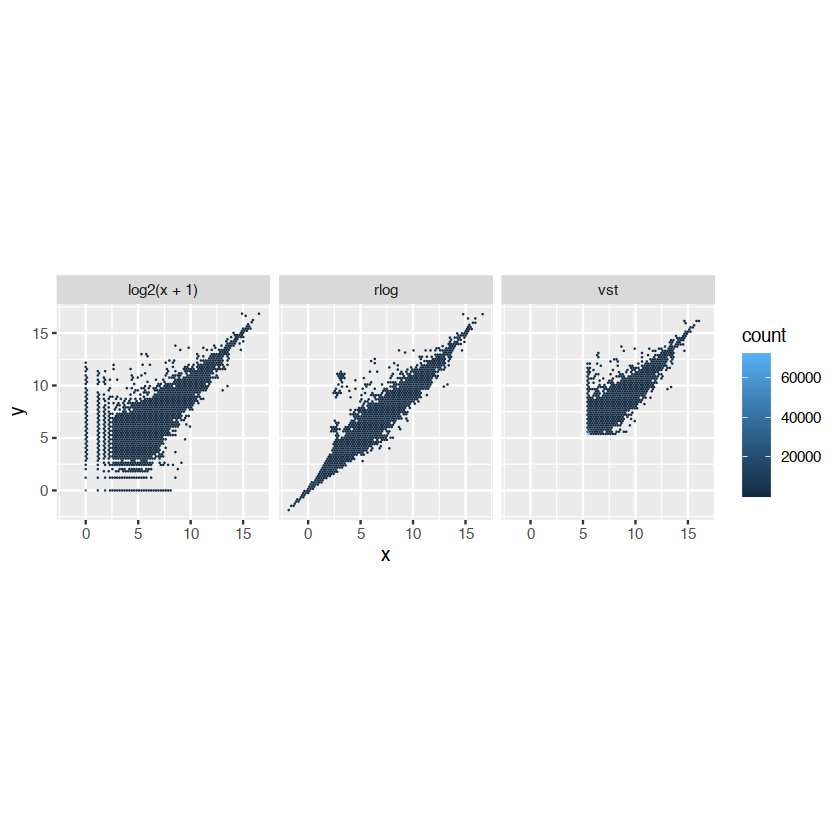

In [25]:
dds <- estimateSizeFactors(dds)

df <- bind_rows(
  as_data_frame(log2(counts(dds, normalized=TRUE)[, 1:2]+1)) %>%
         mutate(transformation = "log2(x + 1)"),
  as_data_frame(assay(vsd)[, 1:2]) %>% mutate(transformation = "vst"),
  as_data_frame(assay(rld)[, 1:2]) %>% mutate(transformation = "rlog"))
  
colnames(df)[1:2] <- c("x", "y")  

ggplot(df, aes(x = x, y = y)) + geom_hex(bins = 80) +
  coord_fixed() + facet_grid( . ~ transformation)  

* **Compute Euclidean sample distances**

> * Transpose dataset & coerce into matrix

In [26]:
sampleDists <- dist(t(assay(vsd)))
sampleDists

          S2_3_2_1  S2_3_2_9  S2_3_2_4  S2_1_2_1  S2_1_2_4  S2_1_2_5  S2_2_2_2
S2_3_2_9 167.28496                                                            
S2_3_2_4 104.57038 162.75034                                                  
S2_1_2_1 104.13654 160.54175 104.33672                                        
S2_1_2_4 126.75408 163.34956 120.17469  93.91661                              
S2_1_2_5 110.18749 169.81285 118.84469  94.13099 107.49950                    
S2_2_2_2 136.08553 167.08227 136.59572 105.99619 103.36629 109.92072          
S2_2_2_5 121.31476 171.43671 128.65036  97.71853 107.58663  95.84291 105.08904
S2_2_2_9 138.30702 177.54195 138.01094 108.78442 110.23610 116.27587 112.14574
          S2_2_2_5
S2_3_2_9          
S2_3_2_4          
S2_1_2_1          
S2_1_2_4          
S2_1_2_5          
S2_2_2_2          
S2_2_2_5          
S2_2_2_9 107.05215

* **Visualize sample distances with heatmap using Euclidean distances**

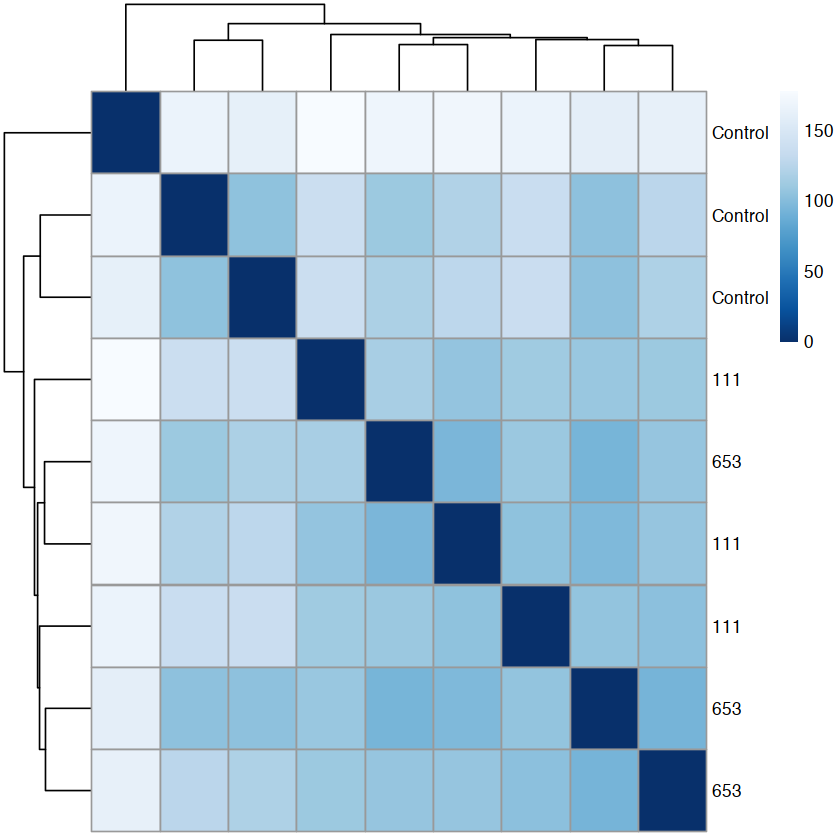

In [27]:
sampleDistMatrix <- as.matrix( sampleDists )
rownames(sampleDistMatrix) <- paste( vsd$group)
colnames(sampleDistMatrix) <- NULL
colors <- colorRampPalette(rev(brewer.pal(9, "Blues")))(255)
pheatmap(sampleDistMatrix,
         clustering_distance_rows = sampleDists,
         clustering_distance_cols = sampleDists,
         cluster_rows=T, cluster_cols=T,
         col = colors)

* **Compute Poisson distances (Witten 2011)**

> * Distances

In [28]:
poisd <- PoissonDistance(t(counts(dds)))

* **Visualize sample distances with heatmap using Poisson distances**

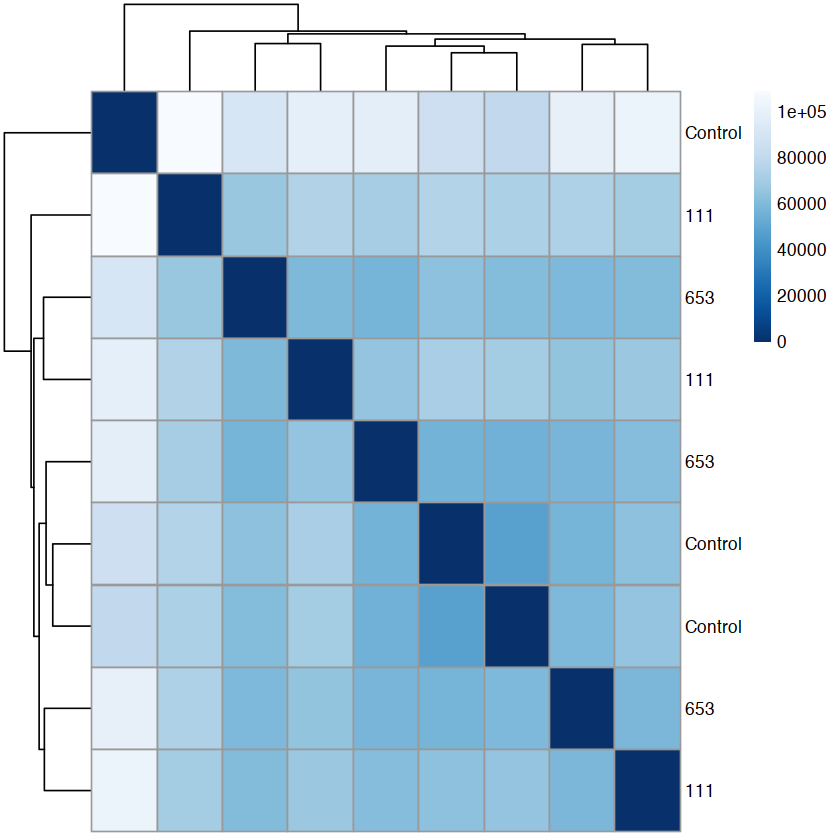

In [29]:
samplePoisDistMatrix <- as.matrix( poisd$dd )
rownames(samplePoisDistMatrix) <- paste( dds$group, sep=" - " )
colnames(samplePoisDistMatrix) <- NULL
pheatmap(samplePoisDistMatrix,
         clustering_distance_rows = poisd$dd,
         clustering_distance_cols = poisd$dd,
         col = colors)

* **Visualize sample-to-sample differences with pricipal components analysis (PCA)**

> * PCA with DESeq2

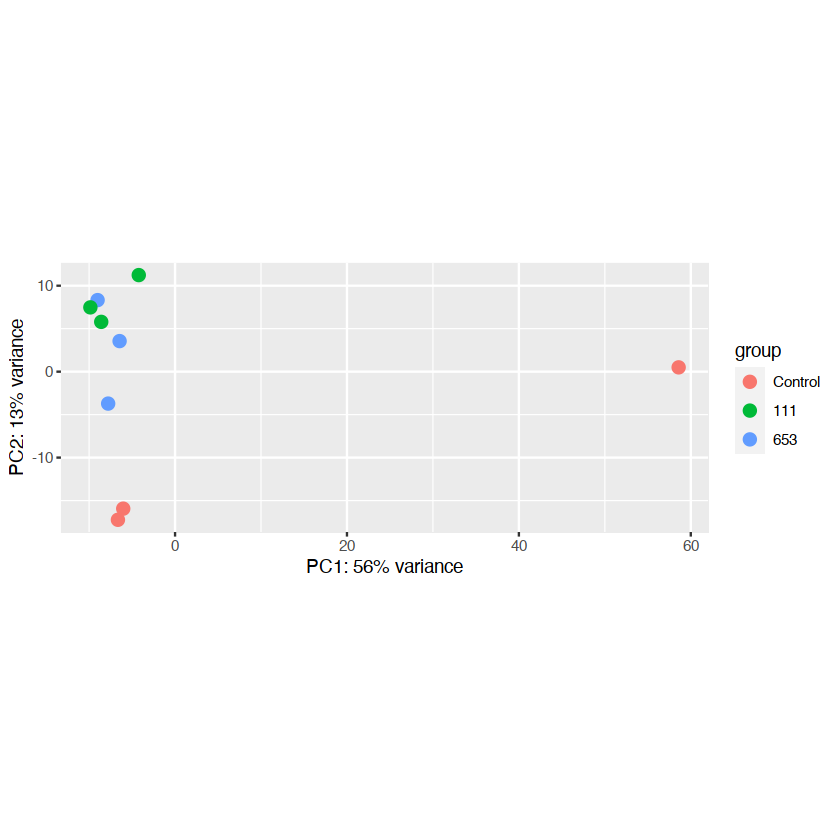

In [30]:
plotPCA(vsd, intgroup = c("group"))

> * PCA with ggplot2

> * View PCs

In [31]:
pcaData <- plotPCA(vsd, intgroup = c( "group"), returnData = TRUE)
pcaData

,PC1,PC2,group,group.1,name
,<dbl>,<dbl>,<fct>,<fct>,<chr>
S2_3_2_1,-6.646067,-17.2333967,Control,Control,S2_3_2_1
S2_3_2_9,58.586935,0.4998174,Control,Control,S2_3_2_9
S2_3_2_4,-6.029665,-15.9366397,Control,Control,S2_3_2_4
S2_1_2_1,-7.783224,-3.7150135,653,653,S2_1_2_1
S2_1_2_4,-6.452647,3.5560928,653,653,S2_1_2_4
S2_1_2_5,-9.011399,8.3241647,653,653,S2_1_2_5
S2_2_2_2,-4.222302,11.2345655,111,111,S2_2_2_2
S2_2_2_5,-8.588481,5.7921773,111,111,S2_2_2_5
S2_2_2_9,-9.853150,7.4782322,111,111,S2_2_2_9


> * Express variation explained to percentage

In [32]:
percentVar <- round(100 * attr(pcaData, "percentVar"))

> * Plot data

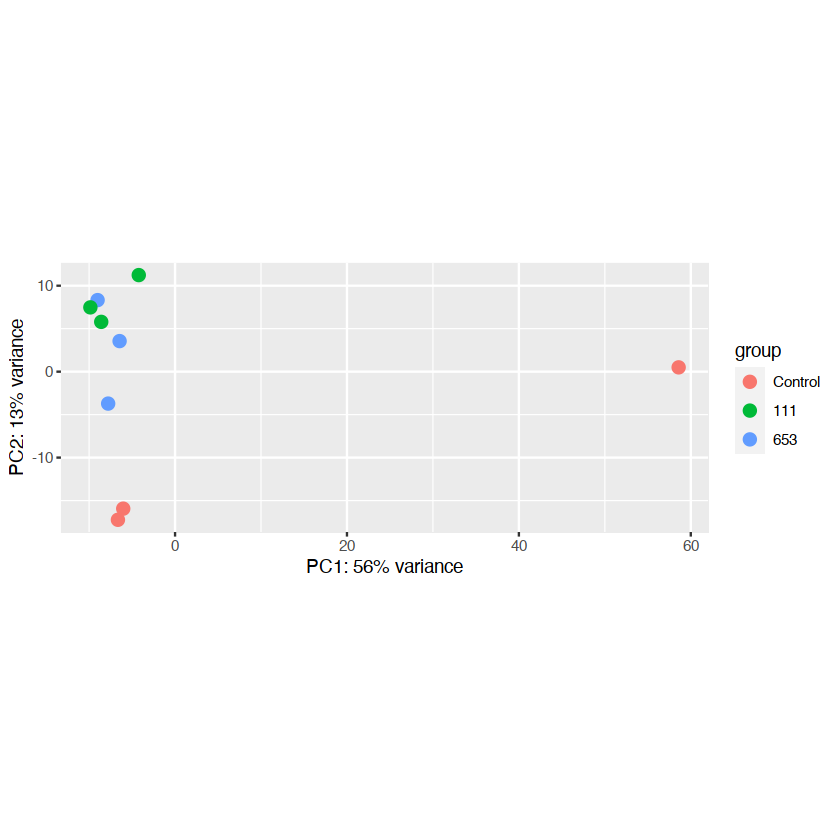

In [33]:
ggplot(pcaData, aes(x = PC1, y = PC2, color = group)) +
  geom_point(size =3) +
  xlab(paste0("PC1: ", percentVar[1], "% variance")) +
  ylab(paste0("PC2: ", percentVar[2], "% variance")) +
  coord_fixed()

* **Visualize sample-to-sample differences with multidimensional scaling (MDS)**

> * VSD data

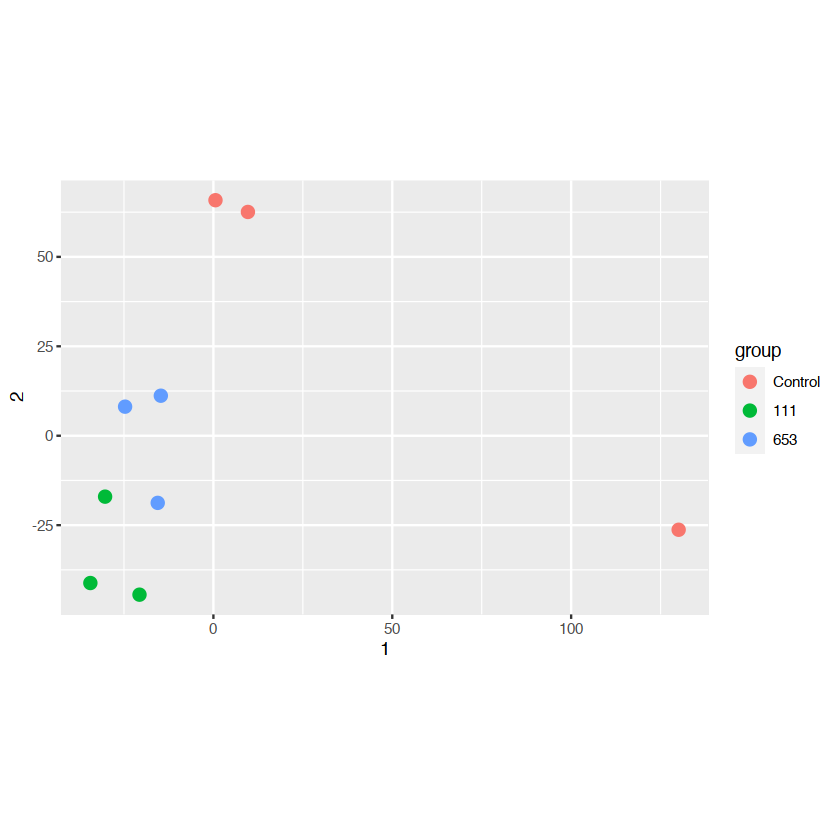

In [34]:
mds <- as.data.frame(colData(vsd))  %>%
         cbind(cmdscale(sampleDistMatrix))
ggplot(mds, aes(x = `1`, y = `2`, color = group)) +
  geom_point(size = 3) + coord_fixed()

> * Poisson data

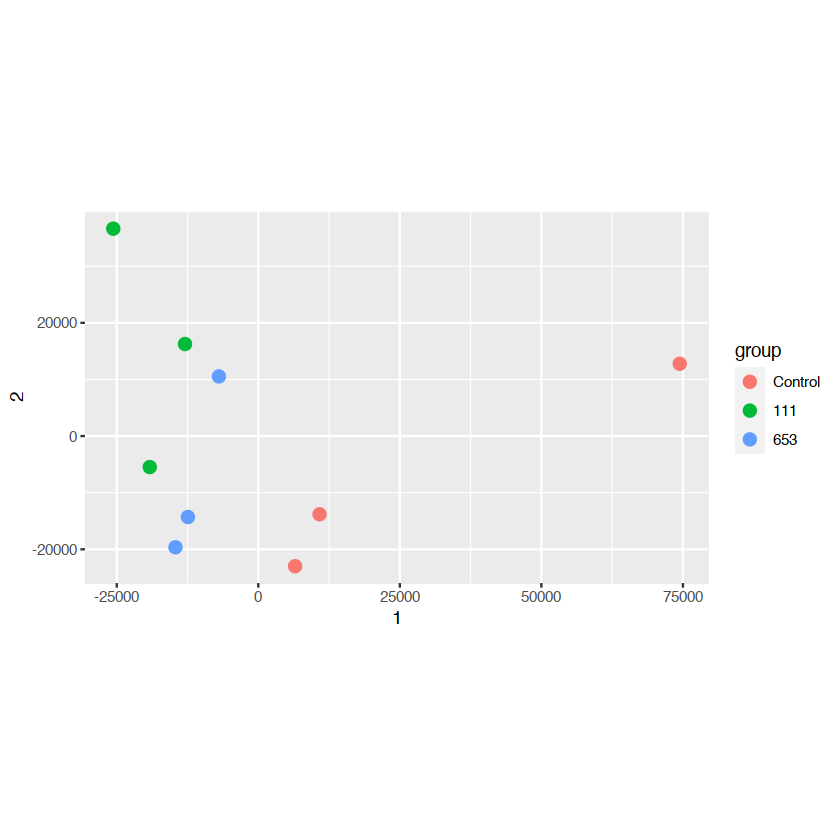

In [35]:
mdsPois <- as.data.frame(colData(dds)) %>%
   cbind(cmdscale(samplePoisDistMatrix))
ggplot(mdsPois, aes(x = `1`, y = `2`, color = group)) +
  geom_point(size = 3) + coord_fixed()

### Diagnostics<a class="anchor" id="nineth-q"></a>  
[Back to Table of Contents](#toc-q)

### Parametric analysis: differential expression analysis<a class="anchor" id="tenth-q"></a>  
[Back to Table of Contents](#toc-q)

* **Identify differentially expressed genes with raw count data**

In [36]:
dds <- DESeq(dds)

using pre-existing size factors

estimating dispersions

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates

fitting model and testing



* **Tabulate results, set $\alpha = 0.05$**
* **Adjust $p$-values with Benjamini & Hochberg (1995) to account for false discoveries**
* **Shrink/deflate effect sizes (Log fold change estimates)**

> * Contrast control vs 653

In [45]:
resultsNames(dds)[3]

[1] "group_653_vs_Control"

In [46]:
Cv653 = results(dds, contrast=c("group","653","Control"),
                independentFiltering=TRUE, alpha=0.001, pAdjustMethod="BH", parallel=TRUE)
#Cv653 = lfcShrink(dds, contrast=c("group","653","Control"), res=Cv653)
Cv653 = lfcShrink(dds, coef = 3 ,type='apeglm', res=Cv653)

using 'apeglm' for LFC shrinkage. If used in published research, please cite:
    Zhu, A., Ibrahim, J.G., Love, M.I. (2018) Heavy-tailed prior distributions for
    sequence count data: removing the noise and preserving large differences.
    Bioinformatics. https://doi.org/10.1093/bioinformatics/bty895



> * Summary

In [47]:
summary(Cv653)


out of 246300 with nonzero total read count
adjusted p-value < 0.001
LFC > 0 (up)       : 73, 0.03%
LFC < 0 (down)     : 111, 0.045%
outliers [1]       : 2543, 1%
low counts [2]     : 138421, 56%
(mean count < 6)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results



> * Contrast control vs 111

In [48]:
resultsNames(dds)

[1] "Intercept"            "group_111_vs_Control" "group_653_vs_Control"

In [51]:
Cv111 = results(dds, contrast=c("group","111","Control"),
                independentFiltering=TRUE, alpha=0.001, pAdjustMethod="BH", parallel=TRUE)
#Cv111 = lfcShrink(dds, contrast=c("group","111","Control"), res=Cv111)
Cv111 = lfcShrink(dds, coef = 2 ,type='apeglm', res=Cv111)

using 'apeglm' for LFC shrinkage. If used in published research, please cite:
    Zhu, A., Ibrahim, J.G., Love, M.I. (2018) Heavy-tailed prior distributions for
    sequence count data: removing the noise and preserving large differences.
    Bioinformatics. https://doi.org/10.1093/bioinformatics/bty895



> * Summary

In [52]:
summary(Cv111)


out of 246300 with nonzero total read count
adjusted p-value < 0.001
LFC > 0 (up)       : 378, 0.15%
LFC < 0 (down)     : 1173, 0.48%
outliers [1]       : 2543, 1%
low counts [2]     : 133688, 54%
(mean count < 5)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results



> * Contrast 653 vs 111

In [53]:
resultsNames(dds)

[1] "Intercept"            "group_111_vs_Control" "group_653_vs_Control"

In [54]:
dds$group

[1] Control Control Control 653     653     653     111     111     111    
Levels: Control 111 653

In [55]:
dds$group <- relevel(dds$group, ref = "111")
dds <- DESeq(dds)

using pre-existing size factors

estimating dispersions

found already estimated dispersions, replacing these

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates

fitting model and testing



In [56]:
resultsNames(dds)

[1] "Intercept"            "group_Control_vs_111" "group_653_vs_111"

In [57]:
i653v111 = results(dds, contrast=c("group","653","111"),
                independentFiltering=TRUE, alpha=0.001, pAdjustMethod="BH", parallel=TRUE)
#i653v111 = lfcShrink(dds, contrast=c("group","653","111"), res=i653v111)
i653v111  = lfcShrink(dds, coef = 3 ,type='apeglm', res=i653v111 )

using 'apeglm' for LFC shrinkage. If used in published research, please cite:
    Zhu, A., Ibrahim, J.G., Love, M.I. (2018) Heavy-tailed prior distributions for
    sequence count data: removing the noise and preserving large differences.
    Bioinformatics. https://doi.org/10.1093/bioinformatics/bty895



> * Summary

In [58]:
summary(i653v111)


out of 246300 with nonzero total read count
adjusted p-value < 0.001
LFC > 0 (up)       : 86, 0.035%
LFC < 0 (down)     : 13, 0.0053%
outliers [1]       : 2543, 1%
low counts [2]     : 152475, 62%
(mean count < 8)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results



* **Subset gene with > or < log 2 fold change and $q$ value < 0.05 ($p$ value post FDR adjustment)**

> * First define the cutoffs for log2 fold differences and the $q$ value 

In [59]:
log2cutoff = 2
qvaluecutoff = 0.001

> * Concatenate results that are differentially expressed (>log2) and adjusted p-values < $q = 0.001$

In [60]:
diffXGenes <- unique(c(
  rownames(subset(Cv653, padj<=qvaluecutoff & abs(log2FoldChange)>=log2cutoff)),
  rownames(subset(Cv111, padj<=qvaluecutoff & abs(log2FoldChange)>=log2cutoff)),
  rownames(subset(i653v111, padj<=qvaluecutoff & abs(log2FoldChange)>=log2cutoff))))

* **Isolate genes for each comparison and sort by the log2 fold change estimates**

> * Down-regulated genes

In [61]:
resSig_Cv653 = subset(Cv653, padj < 0.001)# control vs 653

In [62]:
head(resSig_Cv653[ order(resSig_Cv653$log2FoldChange), ])

log2 fold change (MAP): group 653 vs Control 
Wald test p-value: group 653 vs Control 
DataFrame with 6 rows and 5 columns
                      baseMean log2FoldChange     lfcSE      pvalue        padj
                     <numeric>      <numeric> <numeric>   <numeric>   <numeric>
Cluster-67248.4354    114.3618      -12.34833   3.19338 2.96673e-20 1.04168e-15
Cluster-67248.121974   90.6588      -10.56976   3.00810 1.51275e-14 2.65578e-10
Cluster-6227.0         28.4134       -9.98485   2.96045 1.19391e-12 1.04802e-08
Cluster-67248.98511    19.2628       -9.29264   2.90755 1.13143e-10 4.25644e-07
Cluster-7595.0         18.0599       -9.17921   2.89267 1.68919e-10 5.70727e-07
Cluster-67248.84167    16.2917       -8.97951   2.89162 9.05939e-10 2.38570e-06

In [63]:
summary(resSig_Cv653)


out of 184 with nonzero total read count
adjusted p-value < 0.001
LFC > 0 (up)       : 73, 40%
LFC < 0 (down)     : 111, 60%
outliers [1]       : 0, 0%
low counts [2]     : 0, 0%
(mean count < 6)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results



In [64]:
resSig_Cv111 = subset(Cv111, padj < 0.001)# control vs 111

In [65]:
head(resSig_Cv111[ order(resSig_Cv111$log2FoldChange), ])

log2 fold change (MAP): group 111 vs Control 
Wald test p-value: group 111 vs Control 
DataFrame with 6 rows and 5 columns
                      baseMean log2FoldChange     lfcSE      pvalue        padj
                     <numeric>      <numeric> <numeric>   <numeric>   <numeric>
Cluster-67248.65881   202.9512      -13.31978   3.29965 5.36124e-23 3.10582e-19
Cluster-67248.50623    55.2010      -10.79186   3.06111 3.63533e-14 5.06503e-11
Cluster-67248.161649   30.5120       -9.94939   3.07342 3.49188e-10 1.45953e-07
Cluster-67248.98511    19.2628       -9.34403   2.91418 8.47927e-11 4.42325e-08
Cluster-67248.102583   27.7220       -9.06081   2.92060 1.37306e-09 4.53849e-07
Cluster-67248.132953   24.1723       -9.05935   2.84609 5.35505e-11 2.90357e-08

In [66]:
resSig_653v111 = subset(i653v111, padj < 0.001)# 653 vs 111

In [67]:
head(resSig_653v111[ order(resSig_653v111$log2FoldChange), ])

log2 fold change (MAP): group 653 vs 111 
Wald test p-value: group 653 vs 111 
DataFrame with 6 rows and 5 columns
                      baseMean log2FoldChange     lfcSE      pvalue        padj
                     <numeric>      <numeric> <numeric>   <numeric>   <numeric>
Cluster-67248.121974   90.6588      -11.00131  3.053406 1.28680e-15 1.67803e-11
Cluster-67248.76854    24.3571       -9.61322  3.017561 6.12960e-10 2.79761e-06
Cluster-67248.149503   27.8250       -8.80154  2.839060 5.40284e-10 2.59569e-06
Cluster-67248.75344    15.0450       -7.67952  2.691335 2.58469e-08 5.12904e-05
Cluster-67248.41890    33.3703       -2.35296  0.487300 7.72193e-08 1.21530e-04
Cluster-67248.80974   533.1341       -1.14437  0.248829 1.79032e-07 2.33463e-04

* **Up-regulated genes**

In [68]:
head(resSig_Cv653[ order(resSig_Cv653$log2FoldChange, decreasing = TRUE), ])# control vs 653

log2 fold change (MAP): group 653 vs Control 
Wald test p-value: group 653 vs Control 
DataFrame with 6 rows and 5 columns
                      baseMean log2FoldChange     lfcSE      pvalue        padj
                     <numeric>      <numeric> <numeric>   <numeric>   <numeric>
Cluster-67248.29944   181.0771       10.90667   3.52941 1.08086e-06 6.90022e-04
Cluster-67248.41609   124.2794       10.37864   2.73320 2.13377e-14 3.21090e-10
Cluster-67248.84245    40.9704        9.80587   2.95310 1.22631e-11 7.17638e-08
Cluster-67248.75476    28.4884        8.26255   2.71158 4.38916e-08 5.27616e-05
Cluster-71973.0        21.3302        7.78084   2.56124 1.30277e-08 2.21336e-05
Cluster-67248.107305   20.5010        7.55098   2.64108 3.12311e-07 2.59036e-04

In [69]:
head(resSig_Cv111[ order(resSig_Cv111$log2FoldChange, decreasing = TRUE), ])# control vs 111

log2 fold change (MAP): group 111 vs Control 
Wald test p-value: group 111 vs Control 
DataFrame with 6 rows and 5 columns
                      baseMean log2FoldChange     lfcSE      pvalue        padj
                     <numeric>      <numeric> <numeric>   <numeric>   <numeric>
Cluster-67248.41609   124.2794       10.16721   2.71294 6.57414e-14 8.82451e-11
Cluster-67248.155958   51.2697        9.51137   2.75447 6.13155e-11 3.29216e-08
Cluster-67248.76854    24.3571        8.82637   2.92617 1.14788e-08 2.85852e-06
Cluster-67248.21106    26.2645        8.35075   3.05814 4.63815e-06 4.15054e-04
Cluster-67248.92191    23.6228        8.15874   2.97963 3.61715e-06 3.40578e-04
Cluster-67248.97002    27.6444        7.85570   2.70133 2.70511e-07 4.10138e-05

In [70]:
head(resSig_653v111[ order(resSig_653v111$log2FoldChange, decreasing = TRUE), ])# 653 vs 111

log2 fold change (MAP): group 653 vs 111 
Wald test p-value: group 653 vs 111 
DataFrame with 6 rows and 5 columns
                      baseMean log2FoldChange     lfcSE      pvalue        padj
                     <numeric>      <numeric> <numeric>   <numeric>   <numeric>
Cluster-67248.84245    40.9704       10.64087   3.01024 2.09584e-13 2.12569e-09
Cluster-67248.142094   20.2956        9.30517   2.75820 5.66477e-11 2.87273e-07
Cluster-67248.114284   31.6453        9.01560   2.92378 1.53048e-07 2.08515e-04
Cluster-67248.82896    34.7656        8.93895   3.01005 7.39680e-07 7.26016e-04
Cluster-67248.6264     23.7466        8.54411   2.67685 5.41376e-09 1.49751e-05
Cluster-67248.87571    23.3409        8.43192   2.60290 1.05937e-09 4.02921e-06

**Build Table of DEGs**

Bind all DEGs from each comparisons, by rows

In [71]:
DEGs=rbind(c(resSig_Cv653@rownames,
             resSig_Cv111@rownames,
             resSig_653v111@rownames))

IDs

In [72]:
ID=rep(c("Cv653", "Cv111", "653v111"),
               c(length(resSig_Cv653@rownames),
                length(resSig_Cv111@rownames),
                length(resSig_653v111@rownames)))

Bind DEGs and IDs by column

In [73]:
DEGS=data.frame(as.character(DEGs),ID)

Rename Columns

In [74]:
colnames(DEGS) = c("Gene_ID","Comparison") 

Sanity checks

In [75]:
length(DEGs)

[1] 1834

In [76]:
length(ID)

[1] 1834

In [77]:
length(resSig_Cv653@rownames)

[1] 184

In [78]:
length(resSig_Cv111@rownames)

[1] 1551

In [79]:
length(resSig_653v111@rownames)

[1] 99

In [80]:
length(resSig_Cv653@rownames)+length(resSig_Cv111@rownames)+length(resSig_653v111@rownames)

[1] 1834

Check for unique genes between two datasets

In [81]:
diffXGenes[!(diffXGenes %in% DEGS$Gene_ID)]

character(0)

write data into table

In [67]:
write.csv(DEGS, 
          file="Mentha_DEGs.csv")

**Merge Gene Names with DEGs**

Create column with rownames

In [82]:
Cv653$id <- rownames(Cv653)
Cv111$id <- rownames(Cv111)
i653v111$id <- rownames(i653v111)

Merge data tables

In [83]:
Cv653_GeneNames <- merge(as(Cv653,"data.frame"), gnDF, by="id")
Cv111_GeneNames <- merge(as(Cv111,"data.frame"), gnDF, by="id")
i653v111_GeneNames <- merge(as(i653v111,"data.frame"), gnDF, by="id")

### Visualization<a class="anchor" id="eleventh-q"></a>  
[Back to Table of Contents](#toc-q)

**MA plot**

> * Control vs. 653

In [73]:
setwd("/Users/davidwheeler/Desktop/RESEARCH/Data/TRANSCRIPTOMICS/FIGURES")

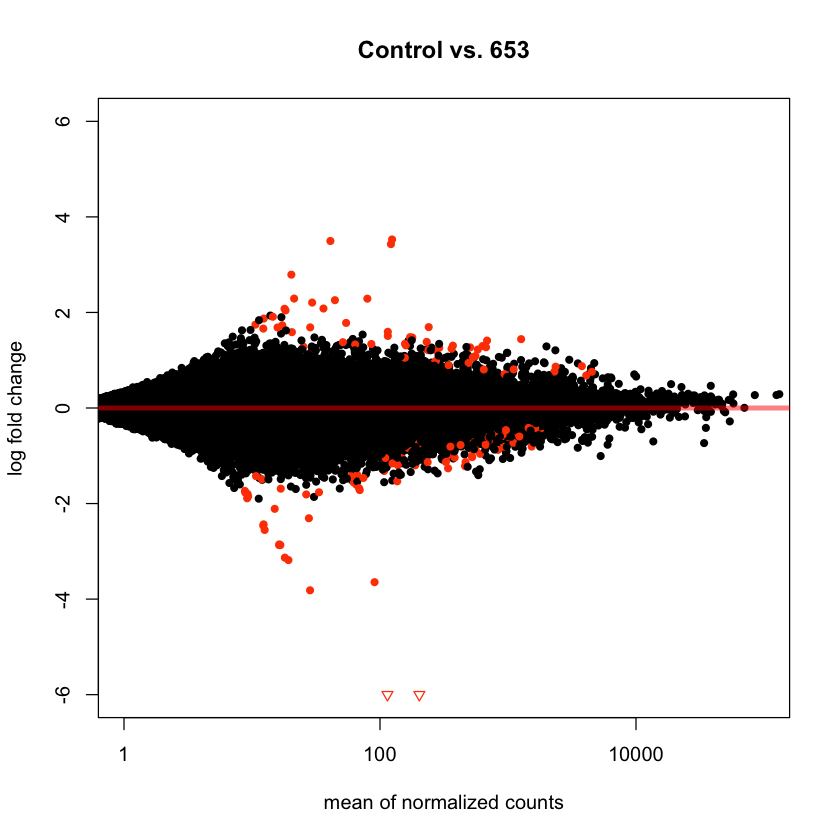

In [74]:
#tiff("Mint_MA-P_Cv653.tiff", width=5, height=5, units='in', res=300)
xlim <- c(1,1e5); ylim <- c(-6,6)
DESeq2::plotMA(Cv653, 
                  xlim=xlim, ylim=ylim,
                  cex=0.9, alpha = 0.001,
                  main="Control vs. 653",
                  colNonSig="black",colSig="orangered1")
#dev.off()

> * 111 vs control

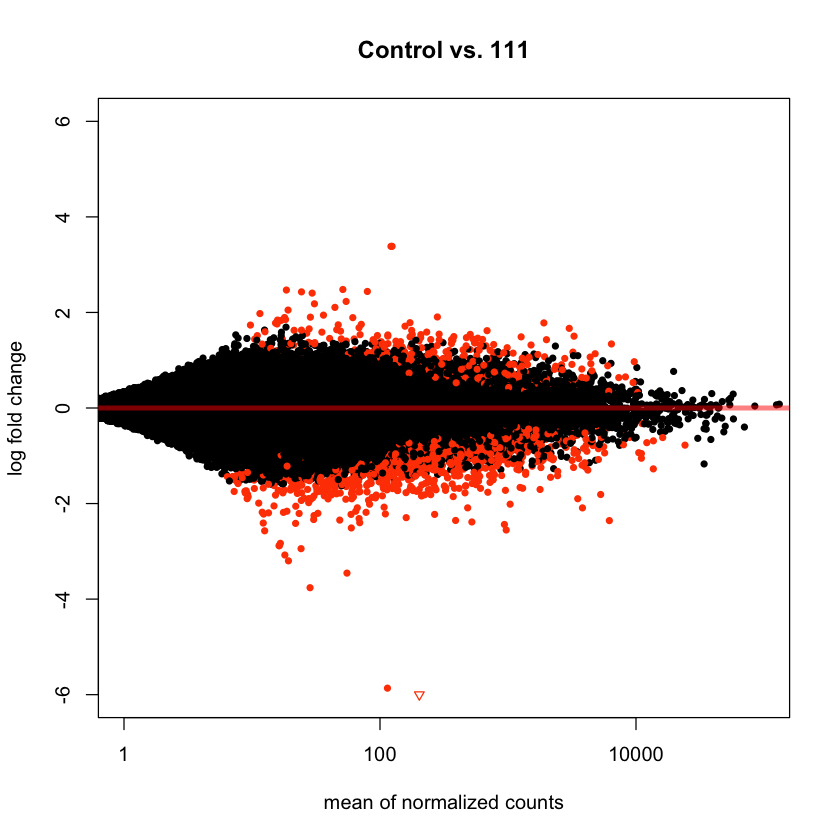

In [57]:
#tiff("Mint_MA-P_Cv111.tiff", width=5, height=5, units='in', res=300)
xlim <- c(1,1e5); ylim <- c(-6,6)
DESeq2::plotMA(Cv111,
                xlim=xlim, ylim=ylim,
                cex=0.8, alpha = 0.001,
                main="Control vs. 111",
                colNonSig="black",colSig="orangered1")
#dev.off()

> * 111 vs. 653

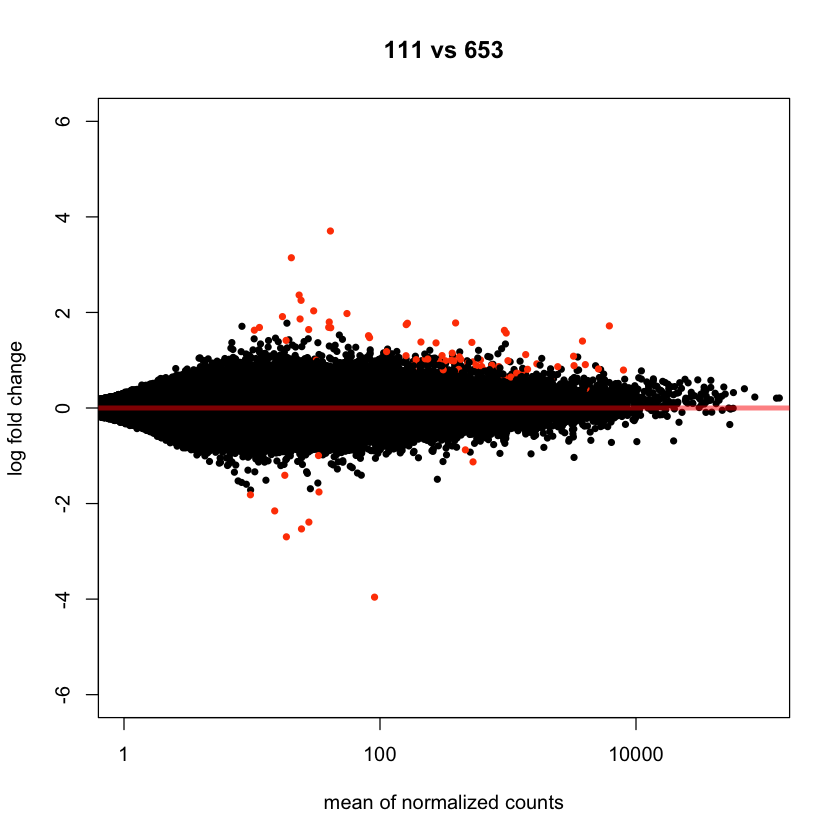

In [58]:
#tiff("Mint_MA-P_111v653.tiff", width=5, height=5, units='in', res=300)
xlim <- c(1,1e5); ylim <- c(-6,6)
DESeq2::plotMA(i653v111,
                xlim=xlim, ylim=ylim,
                cex=0.8, alpha = 0.001,
                main="111 vs 653",
                colNonSig="black",colSig="orangered1")
#dev.off()

**Histograms of $p$-values**

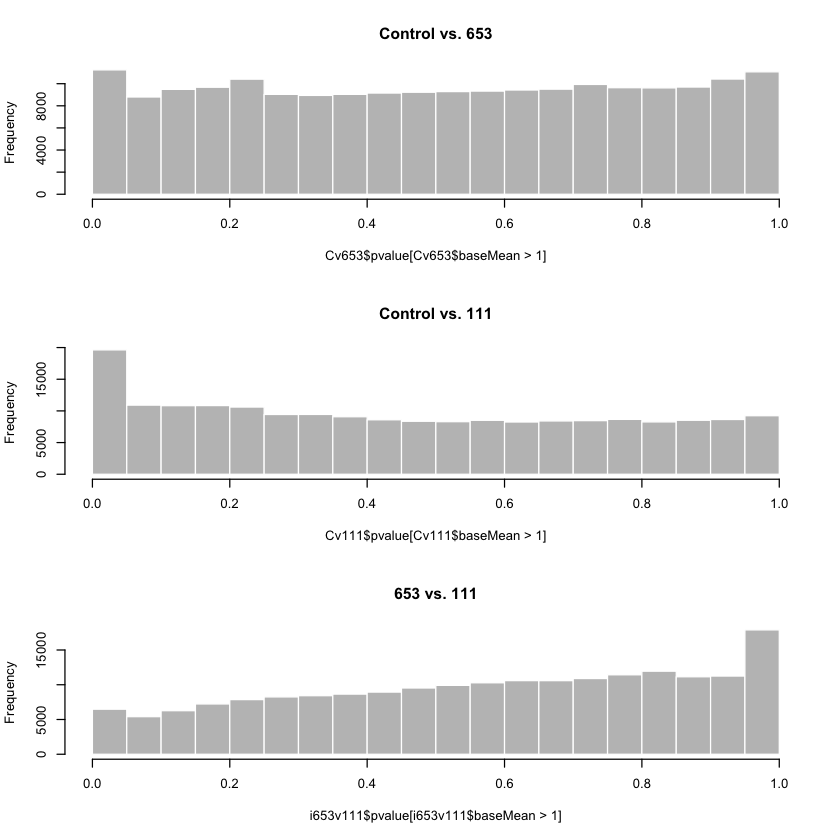

In [59]:
par(mfrow=c(3,1))
hist(Cv653$pvalue[Cv653$baseMean > 1], breaks = 0:20/20,
     col = "grey75", border = "white", main = "Control vs. 653")
hist(Cv111$pvalue[Cv111$baseMean > 1], breaks = 0:20/20,
     col = "grey75", border = "white", main = "Control vs. 111")
hist(i653v111$pvalue[i653v111$baseMean > 1], breaks = 0:20/20,
     col = "grey75", border = "white", main = "653 vs. 111")

**Volcano plots**

> * 653 vs control

In [146]:
Cv653_gn = subset(Cv653_GeneNames, Comparison == "Cv653")

* Order genes by fold change values

In [147]:
Cv653_gn = (Cv653_gn[order(-abs(Cv653_gn$log2FoldChange)),])

Convert 10 DEG gene names from factors to vectors

In [148]:
labs = head(Cv653_gn$Hit1_acc, n=20)
lab = as.character(labs)
lab
labels = c('CNGC5_ARATH', 'RBS2_BRANA', 'RBS2_BRANA', 'ARP3_ARATH', 'FB30_ARATH',
           'PMTK_ARATH', 'CO1A1_HUMAN', 'CB21_SINAL', 'CB5_ARATH', 'TEX10_HUMAN',
           'BCA1_ARATH', 'CB1C_ARATH', '-', 'CA4_ARATH', 'RCA_ARATH',
           'G3PA2_ARATH', 'PIF1_XENLA', '-','PER45_ARATH', 'PLST1_ARATH')



[1] "CNGC5_ARATH" "RBS2_BRANA"  "RBS2_BRANA"  "ARP3_ARATH"  "FB30_ARATH" 
 [6] "PMTK_ARATH"  "CO1A1_HUMAN" "CB21_SINAL"  "CB5_ARATH"   "TEX10_HUMAN"
[11] "BCA1_ARATH"  "CB1C_ARATH"  "-"           "CA4_ARATH"   "RCA_ARATH"  
[16] "G3PA2_ARATH" "PIF1_XENLA"  "-"           "PER45_ARATH" "PLST1_ARATH"

Warning message in EnhancedVolcano(Cv653_GeneNames, lab = NA, x = "log2FoldChange", :
“transcriptPointSize argument deprecated in v1.4 - please use pointSize”
Warning message in EnhancedVolcano(Cv653_GeneNames, lab = NA, x = "log2FoldChange", :
“transcriptLabSize argument deprecated in v1.4 - please use labSize”
Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



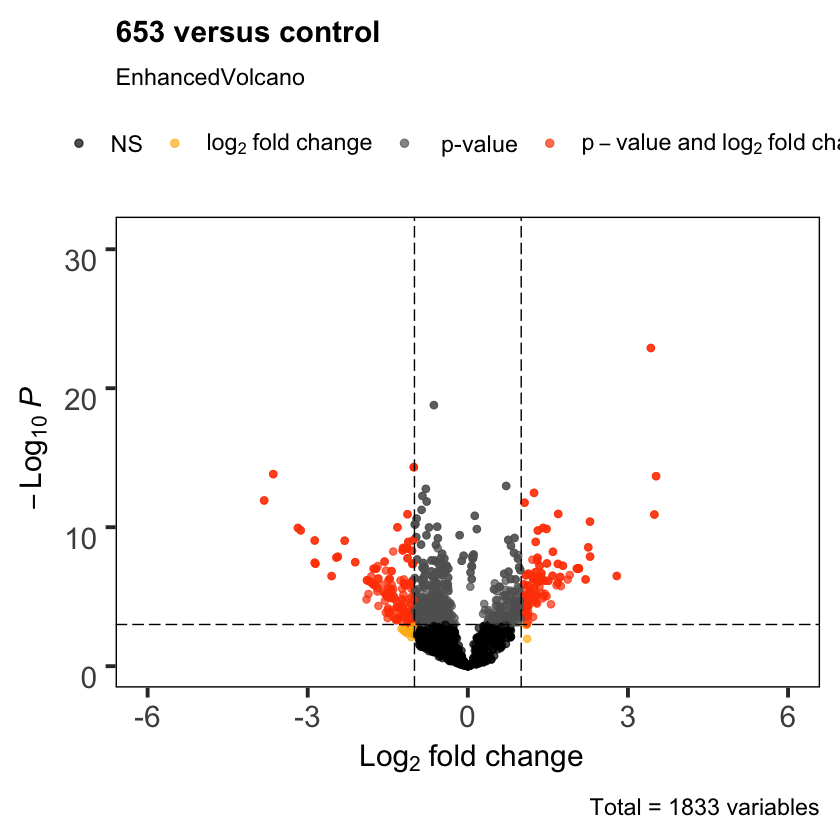

In [149]:
# tiff("/Users/davidwheeler/Desktop/RESEARCH/Data/TRANSCRIPTOMICS/FIGURES/Mint/Mint_VP_Cv653.tiff",
#      width=10, height=10, units='in', res=300)


Cv6=EnhancedVolcano(Cv653_GeneNames,
    lab = NA,
    x = 'log2FoldChange',
    y = 'pvalue',
    title = "653 versus control",
    legend=c("NS","Log2 fold-change","p-value",
    "p-value & Log2 fold-change"),
#     legend = c('NS', expression(log[2]~FC),
#     "p-value", expression(p-value~and~log[2]~FC)),
    legendPosition = "top",
    legendLabSize = 14,
    legendIconSize = 2.0,
    pCutoff = 0.001,
    FCcutoff = 1.0,
    transcriptPointSize = 1.75,
    transcriptLabSize = 3.0,
    colAlpha = 0.7,
    border = "full",
    gridlines.major = FALSE,
    gridlines.minor = FALSE,          
    xlim = c(-6, 6),
    ylim = c(0, min(log10(Cv653$pvalue))),
    col=c("black", "darkgoldenrod1", "gray38", "orangered1"))

Cv6 + scale_color_manual(
  values=c(
    NS="black",
    FC="darkgoldenrod1",
    P="gray38",
    FC_P="orangered1"),
  labels=c(
    NS='NS',
    FC=expression(log[2]~fold~change),
    P="p-value",
    FC_P=expression(p-value~and~log[2]~fold~change)))

# dev.off()

> * 111 vs control

Warning message in EnhancedVolcano(Cv111, lab = NA, x = "log2FoldChange", y = "pvalue", :
“transcriptPointSize argument deprecated in v1.4 - please use pointSize”
Warning message in EnhancedVolcano(Cv111, lab = NA, x = "log2FoldChange", y = "pvalue", :
“transcriptLabSize argument deprecated in v1.4 - please use labSize”
Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



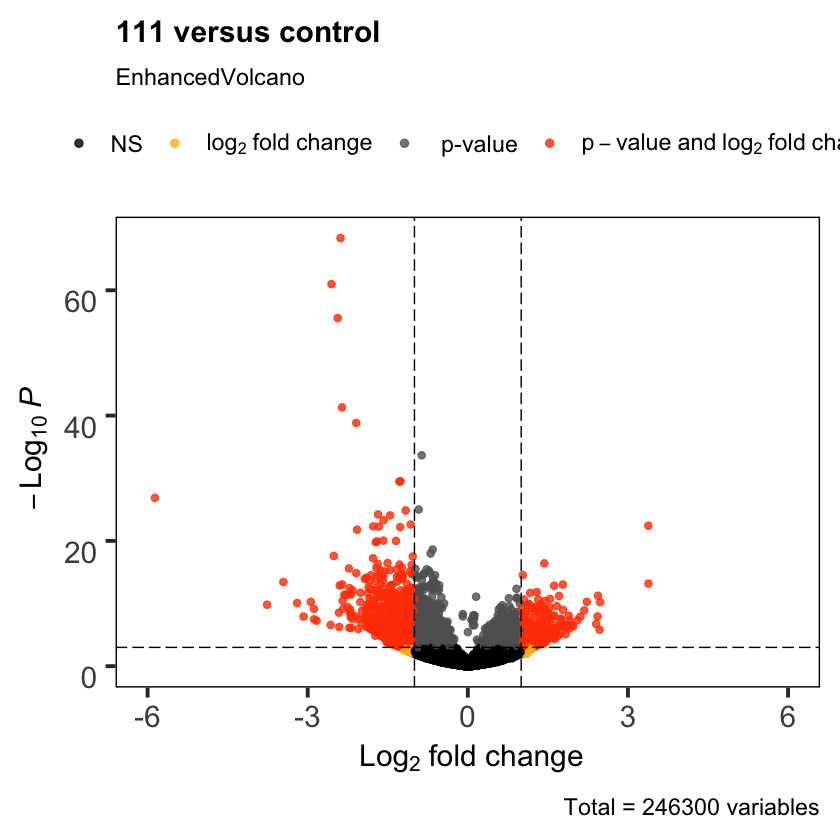

In [150]:
# tiff("/Users/davidwheeler/Desktop/RESEARCH/Data/TRANSCRIPTOMICS/FIGURES/Mint/Mint_VP_Cv111.tiff", 
#      width=10, height=10, units='in', res=300)

Cv1=EnhancedVolcano(Cv111,
    lab = NA,
    x = 'log2FoldChange',
    y = 'pvalue',
    title = "111 versus control",
    legend=c("NS","Log2 fold-change","p-value",
    "p-value & Log2 fold-change"),
    legendPosition = "top",
    legendLabSize = 14,
    legendIconSize = 2.0,
    pCutoff = 0.001,
    FCcutoff = 1.0,
    transcriptPointSize = 1.75,
    transcriptLabSize = 3.0,
    colAlpha = 0.8,
    border = "full",
    gridlines.major = FALSE,
    gridlines.minor = FALSE,
    xlim = c(-6, 6),
    ylim = c(0, min(log10(Cv111$pvalue))),
    col=c("black", "darkgoldenrod1", "gray38", "orangered1"))
Cv1 + scale_color_manual(
  values=c(
    NS="black",
    FC="darkgoldenrod1",
    P="gray38",
    FC_P="orangered1"),
  labels=c(
    NS='NS',
    FC=expression(log[2]~fold~change),
    P="p-value",
    FC_P=expression(p-value~and~log[2]~fold~change)))

# dev.off()

> * 653 vs. 111

In [151]:
-log10(0.001)

[1] 3

Warning message in EnhancedVolcano(i653v111, lab = NA, x = "log2FoldChange", y = "pvalue", :
“transcriptPointSize argument deprecated in v1.4 - please use pointSize”
Warning message in EnhancedVolcano(i653v111, lab = NA, x = "log2FoldChange", y = "pvalue", :
“transcriptLabSize argument deprecated in v1.4 - please use labSize”
Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



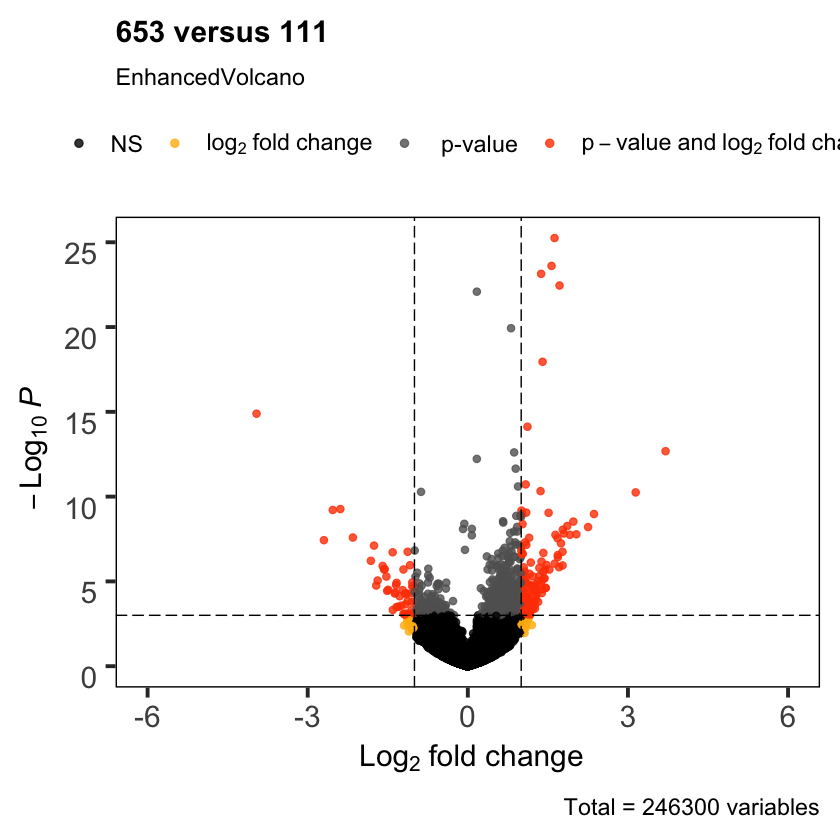

In [152]:
# tiff("/Users/davidwheeler/Desktop/RESEARCH/Data/TRANSCRIPTOMICS/FIGURES/Mint/Mint_VP_653v111.tiff",
#      width=10, height=10, units='in', res=300)


i6vi1=EnhancedVolcano(i653v111,
    lab = NA,
    x = 'log2FoldChange',
    y = 'pvalue',
    title = "653 versus 111",
    legend=c("NS","Log2 fold-change","p-value",
    "p-value & Log2 fold-change"),
    legendPosition = "top",
    legendLabSize = 14,
    legendIconSize = 2.0,
    pCutoff = 0.001,
    FCcutoff = 1.0,
    transcriptPointSize = 1.75,
    transcriptLabSize = 3.0,
    colAlpha = 0.8,
    border = "full",
    gridlines.major = FALSE,
    gridlines.minor = FALSE,
    xlim = c(-6, 6),
    ylim = c(0, min(log10(i653v111$pvalue))),
    col=c("black", "darkgoldenrod1", "gray38", "orangered1"))
i6vi1 + scale_color_manual(
  values=c(
    NS="black",
    FC="darkgoldenrod1",
    P="gray38",
    FC_P="orangered1"),
  labels=c(
    NS='NS',
    FC=expression(log[2]~fold~change),
    P="p-value",
    FC_P=expression(p-value~and~log[2]~fold~change)))

# dev.off()

Where is the biggest change?

In [153]:
max(abs(Cv653_GeneNames$log2FoldChange))
max(abs(Cv111_GeneNames$log2FoldChange))
max(abs(i653v111_GeneNames$log2FoldChange))

[1] 6.286467

[1] 6.55892

[1] 3.958994

**Cluster Genes**

Heatmap I

- Are there any duplicated genes?

In [84]:
table_all[,7][duplicated(table_all[,7])]

ERROR: Error in eval(expr, envir, enclos): object 'table_all' not found


- Number of unique genes

In [85]:
length(unique(table_all[,7]))

ERROR: Error in h(simpleError(msg, call)): error in evaluating the argument 'x' in selecting a method for function 'unique': object 'table_all' not found


- Remove duplicate genes

In [86]:
degs = table_all[!duplicated(table_all[,7]),]

ERROR: Error in eval(expr, envir, enclos): object 'table_all' not found


Object for heatmap

In [518]:
heat <- assay(vsd)[degs[,7],]

Convert to dataframe

In [519]:
hmDF = data.frame(heat)

Confirm order

In [520]:
rownames(hmDF) == degs[,7]

[1] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
[16] TRUE TRUE TRUE TRUE

Find indices of unknown genes

In [521]:
rownames(hmDF)[which(degs[,6] == "-")]

[1] "Cluster-67248.142094" "Cluster-71973.0"      "Cluster-67248.88523" 
[4] "Cluster-67248.148461"

Replace dashes with mRNA names

- Index object

In [522]:
Index = degs[,6] == "-"

- convert to character to solve NA problem

In [523]:
degs[,6] = as.character(degs[,6])

* replace NAs with fragment names

In [524]:
degs[,6][Index] = rownames(hmDF)[Index]

Replace rownames in heatmap object with gene names

- Delete duplicate genes

In [525]:
length(unique(degs[,6])) == length(degs[,6])

[1] FALSE

In [526]:
hmDF = hmDF[-which(duplicated(degs[,6])),]

In [527]:
degs = degs[-which(duplicated(degs[,6])),6]

- Replace fragment names with gene names

> - Confirm order

In [528]:
rownames(hmDF) = degs

Reorder genes

In [529]:
ord_row_labs = rownames(hmDF)[(Mint_DEGs$tree_row$order)]

In [530]:
row_labs = cat(paste0('"', paste(ord_row_labs, collapse="\", \""), '"'))

"CNGC5_ARATH", "PMTK_ARATH", "Cluster-67248.142094", "Cluster-71973.0", "Cluster-67248.88523", "P2C14_ARATH", "PSL4_ARATH", "PNSB3_ARATH", "CB21_SINAL", "RBS2_BRANA", "FB30_ARATH", "PER45_ARATH", "ARP3_ARATH", "IFRH_ARATH", "EGL1_ARATH", "C3H53_ORYSJ", "Cluster-67248.148461", "SBT16_ARATH"

Italicize names

In [531]:
newnames <- lapply(
  rownames(hmDF),
  function(x) bquote(italic(.(x))))

Heatmap

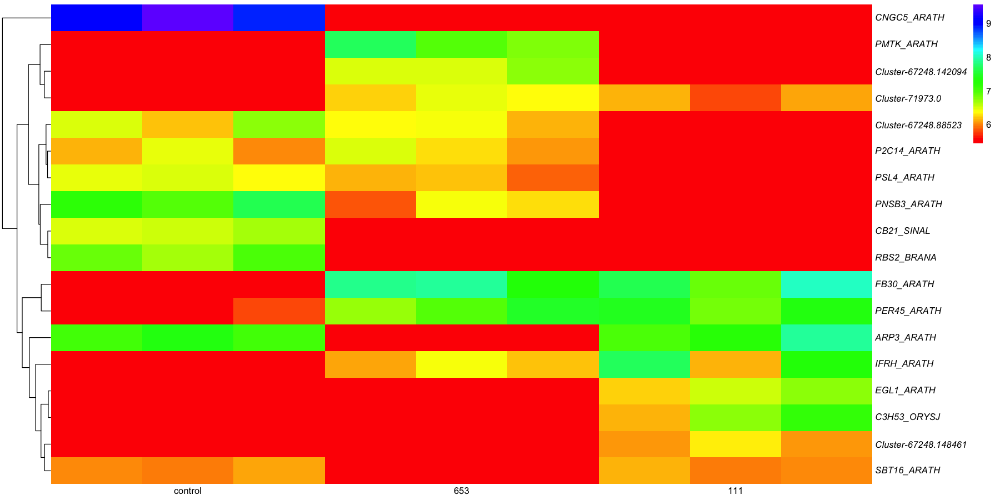

In [532]:
options(repr.plot.width=15, repr.plot.height=7.5)
Mint_DEGs=pheatmap(hmDF,
  color= (rainbow(96,start=0.0,end=0.74,alpha=1)),
  border_color = NA,
  cluster_cols=F,
  show_colnames = TRUE,
  show_rownames = TRUE,
  labels_col=paste0(c(" ","control"," ","","653"," ", " ","111"," ")),
  angle_col=0,
  labels_row = as.expression(newnames))

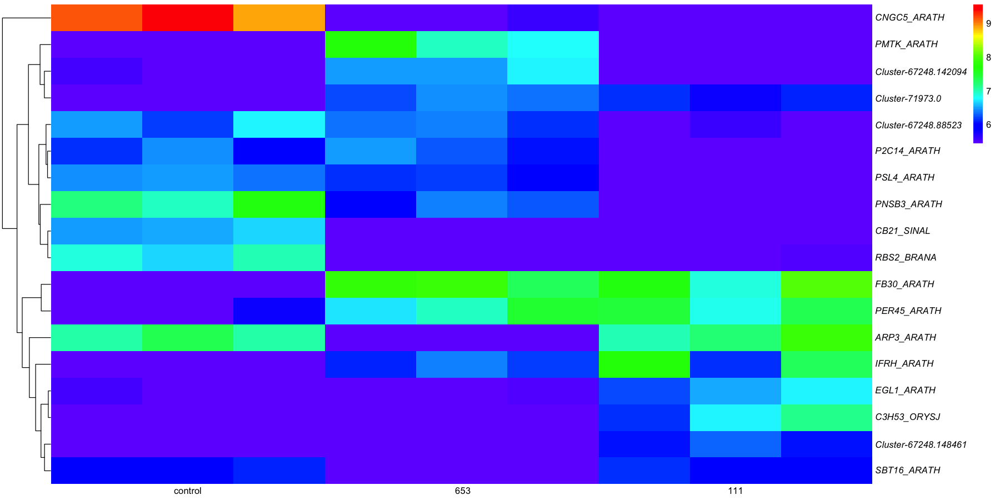

In [533]:
options(repr.plot.width=15, repr.plot.height=7.5)
Mint_DEGs=pheatmap(hmDF,
        color= rev(rainbow(96,start=0.0,end=0.74,alpha=1)),#,s=1,v=0.6,start=0.5,end=0.01),
        border_color = NA,
        cluster_cols=F,
        show_colnames = TRUE,
        show_rownames = TRUE,
        labels_col=paste0(c("","control"," ", ""," 653"," ", "","111"," ")),
        angle_col=0,
        labels_row = as.expression(newnames))

In [493]:
getwd()

[1] "/Users/davidwheeler/Desktop/RESEARCH/Data/TRANSCRIPTOMICS/FIGURES/Mint"

In [534]:
setwd('/Users/davidwheeler/Desktop/RESEARCH/Data/TRANSCRIPTOMICS/FIGURES//Mint')
tiff("Mint_HeatMap.tiff", width = 8, height =5, units = 'in', res = 300)
Mint_DEGs
dev.off()

pdf 
  2

Heatmap II

Object for heatmap

In [126]:
heat <- assay(vsd)[diffXGenes,]

Convert to dataframe

In [127]:
hmDF = data.frame(heat)

Extract subset of genenames that are differentially expressed

* First, make new column of character gene IDs

In [128]:
gnDF["ID"] = as.character(gnDF$id)

- Differentially expressed genes

In [129]:
degs = subset(gnDF, gnDF$ID %in% rownames(hmDF) &
              !grepl("HUMAN", gnDF$Hit1_acc ) &
              !grepl("XENLA", gnDF$Hit1_acc ))

* Use only unique/non duplicated rows

In [130]:
degs = degs[!duplicated(degs$ID),]

In [131]:
degs = degs[!duplicated(degs$Hit1_acc),]

- Remove Human and XENLO genes from dataframe

In [82]:
hmDF = subset(hmDF, rownames(hmDF) %in% degs$id)

* Sanity checks

In [83]:
length(degs$ID) == length(rownames(hmDF))

[1] TRUE

In [84]:
class(degs$ID) == class(rownames(hmDF))

[1] TRUE

* Reorder rows of both dataframes to align with each other

In [85]:
hmDF <- hmDF[with(hmDF, order(rownames(hmDF))), ]

In [86]:
degs <- degs[with(degs, order(degs$ID)), ]

* Sanity check

In [87]:
rownames(hmDF) == degs$ID

[1] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
[16] TRUE TRUE TRUE TRUE

Confirm length

In [88]:
length(rownames(hmDF))

[1] 19

Convert dataframe to matrix

In [89]:
hmdf = as.matrix(hmDF)

Replace rownames in heatmap object with gene names

In [100]:
length(rownames(hmdf)) == length(degs$Hit1_acc)

[1] TRUE

In [111]:
rownames(hmdf) = degs$Hit1_acc

Order row labels to italicize

In [112]:
ord_row_labs = rownames(hmdf)[(Mint_DEGs$tree_row$order)]

In [113]:
row_labs = cat(paste0('"', paste(ord_row_labs, collapse="\", \""), '"'))

"INO1_SESIN", "APR3_ARATH", "APR1_ARATH", "CNGC5_ARATH", "ARP3_ARATH", "PKL_ARATH", "FL3H_PETCR", "FB30_ARATH", "PER45_ARATH", "PLST1_ARATH", "-", "PMTK_ARATH", "SBT16_ARATH", "C3H53_ORYSJ", "PSL4_ARATH", "P2C14_ARATH", "RBS2_BRANA", "CB21_SINAL", "CB5_ARATH"

- Italicize names

In [119]:
newnames <- lapply(
  rownames(hmdf),
  function(x) bquote(italic(.(x))))

Visualize heatmap

- italicize row names

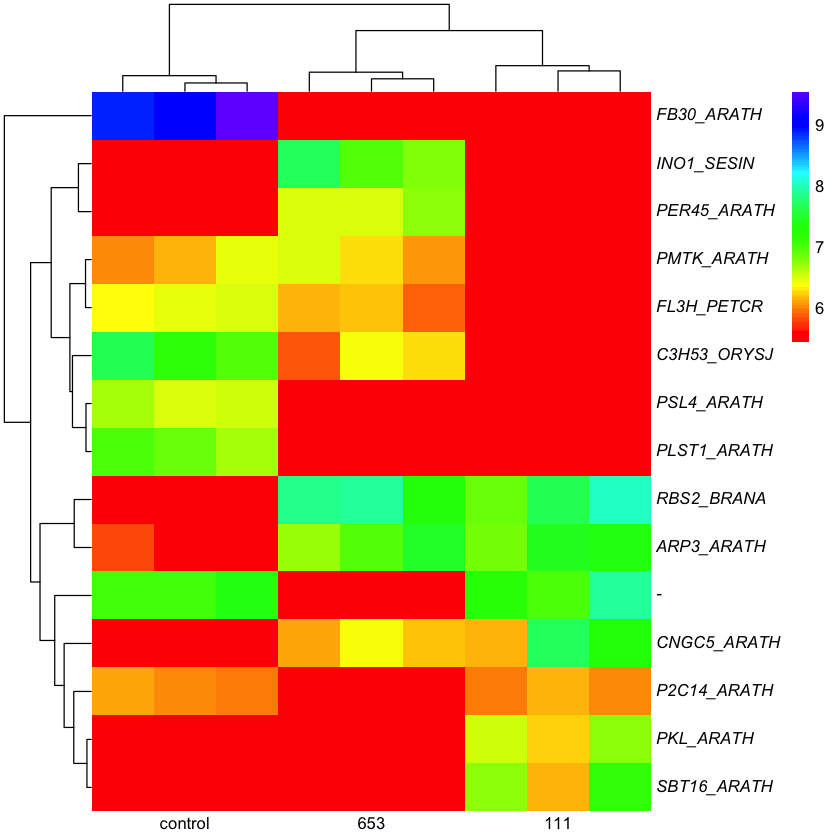

In [270]:
Mint_DEGs=pheatmap(hmDF,
  color= (rainbow(96,start=0.0,end=0.74,alpha=1)),
  border_color = NA,
  show_colnames = TRUE,
  show_rownames = TRUE,
  labels_col=paste0(c("control"," "," ","","653"," ", "111"," "," ")),
  angle_col=0,
  labels_row = as.expression(newnames))

In [150]:
setwd('/Users/davidwheeler/Desktop/RESEARCH/Data/TRANSCRIPTOMICS/FIGURES//Mint')
tiff("Mint_HeatMap_1.tiff", width = 5, height =10, units = 'in', res = 300)
Mint_DEGs
dev.off()

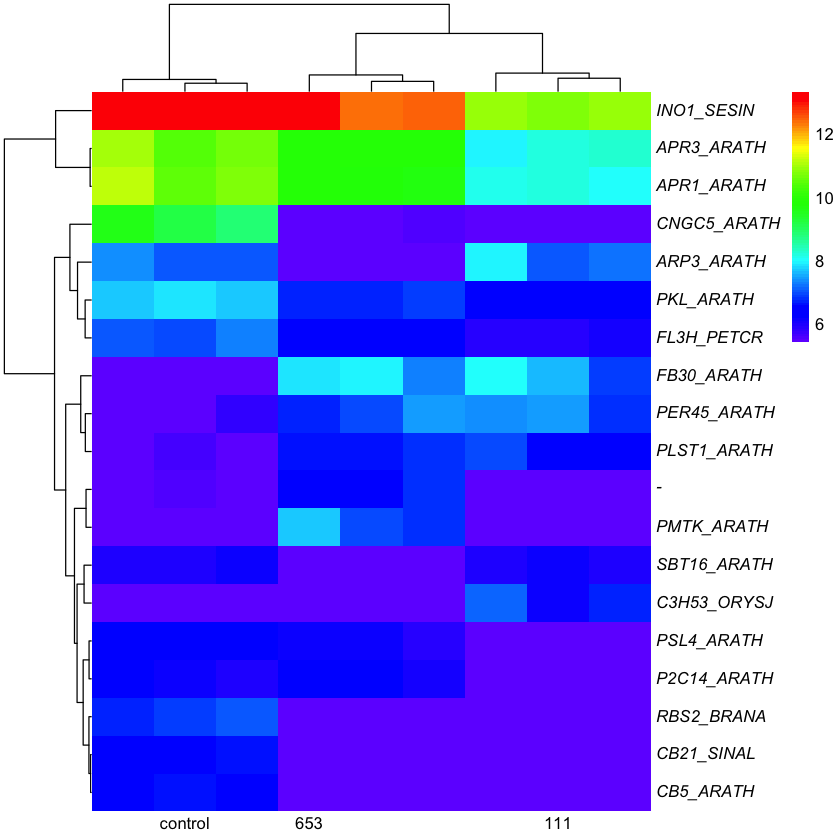

In [106]:
Mint_DEGs=pheatmap(hmdf,
        color= rev(rainbow(96,start=0.0,end=0.74,alpha=1)),#,s=1,v=0.6,start=0.5,end=0.01),
        border_color = NA,
        show_colnames = TRUE,
        show_rownames = TRUE,
        labels_col=paste0(c("control"," "," ", "653"," "," ", "111"," "," ")),
        angle_col=0,
        labels_row = as.expression(newnames))

In [123]:
tiff("/Users/davidwheeler/Desktop/RESEARCH/Data/TRANSCRIPTOMICS/FIGURES//Mint/Mint_HeatMap_2.tiff",
     width = 5, height =5, units = 'in', res = 300)
Mint_DEGs
dev.off()

pdf 
  2

**Venn Diagram**

Control vs 653

In [69]:
resSig_Cv653 = subset(Cv653, padj < 0.001)
resSig_Cv653_fragments = row.names(resSig_Cv653)

Control vs 111

In [70]:
resSig_Cv111 = subset(Cv111, padj < 0.001)
resSig_Cv111_fragments = row.names(resSig_Cv111)

653 vs 111

In [71]:
resSig_653v111 = subset(i653v111, padj < 0.001)
resSig_653v111_fragments = row.names(resSig_653v111)

Build common dataframe

In [72]:
vdDF = c(resSig_Cv653_fragments,
         resSig_Cv111_fragments,
        resSig_653v111_fragments)

Compare

In [73]:
resSig_Cv653_fragments.2 <- vdDF %in% resSig_Cv653_fragments
resSig_Cv111_fragments.2 <- vdDF %in% resSig_Cv111_fragments
resSig_653v111_fragments.2 <- vdDF %in% resSig_653v111_fragments

Compute venn diagram counts

In [74]:
counts = cbind(resSig_Cv653_fragments.2, resSig_Cv111_fragments.2, resSig_653v111_fragments.2)
vdcounts = vennCounts(counts)

Plot - this is incorrect!

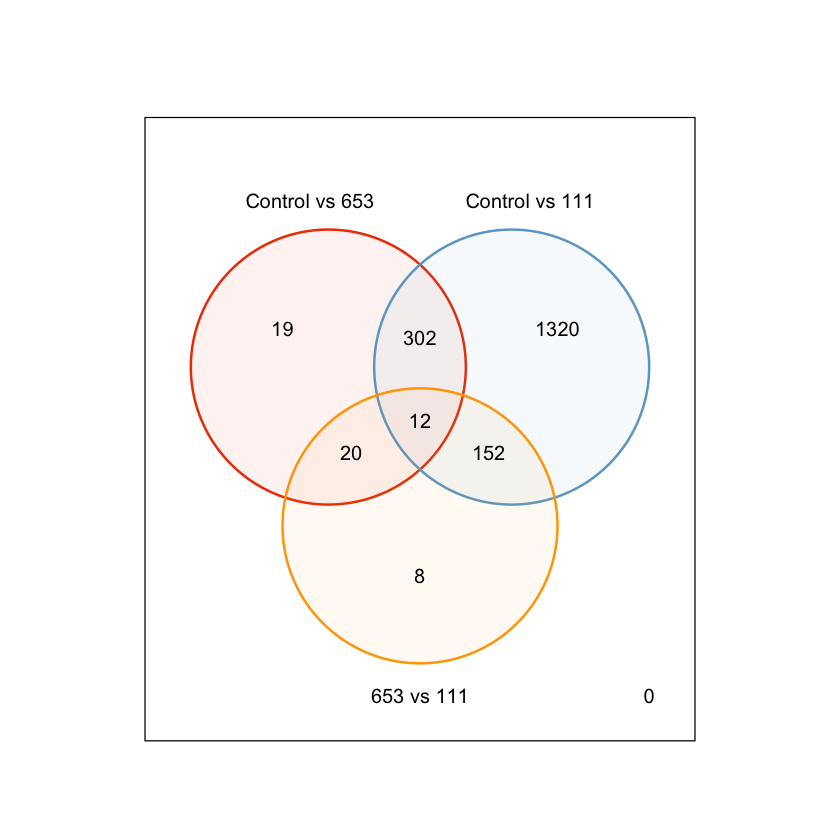

In [71]:
#tiff("Mint_VD.tiff", width=5, height=5, units = 'in', res = 300)
vennDiagram(vdcounts,
            cex=1,
            lwd=2,
            names=c("Control vs 653","Control vs 111","653 vs 111"),
            circle.col = c("orangered2","skyblue3","orange1"))

#dev.off()

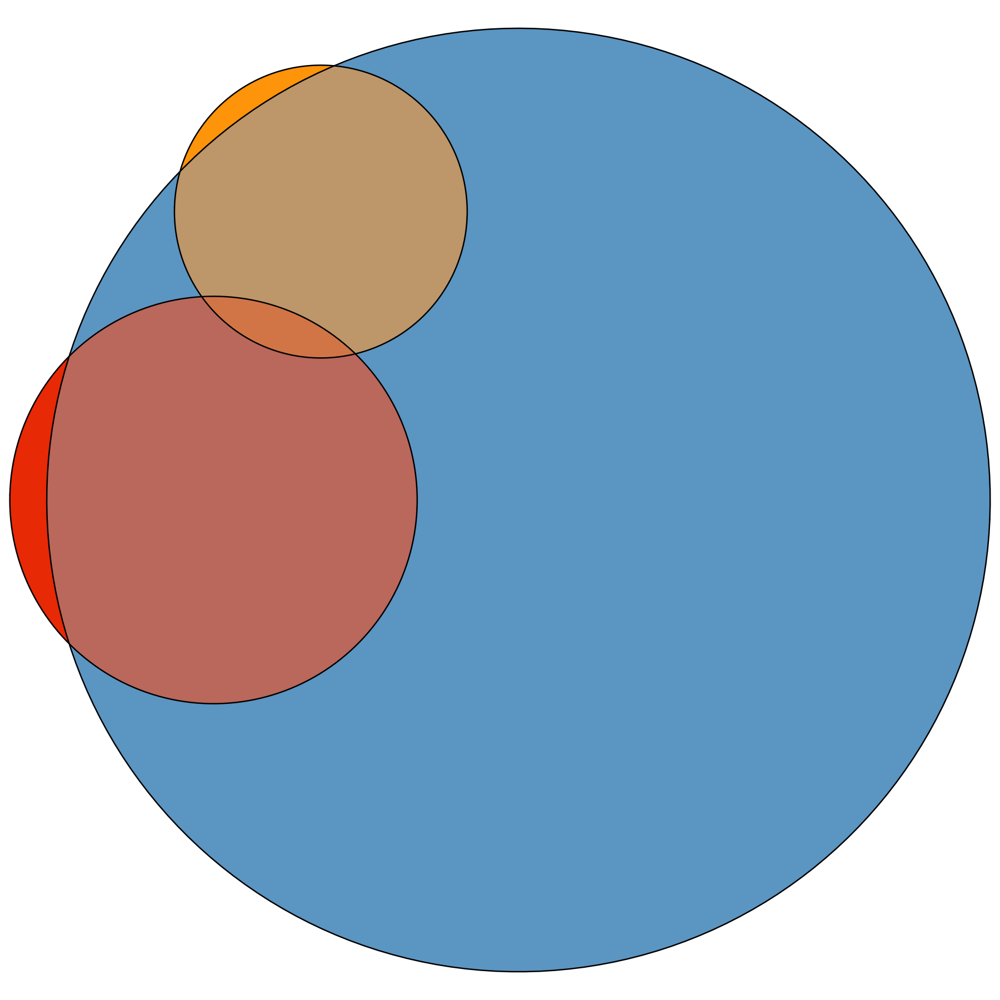

In [65]:
#tiff("Mint_VD-2.tiff", width=5, height=5, units = 'in', res = 300)
VD = euler(c(A=19, B=1320, C=8,
            "A&B"=302, "A&C"=20, "B&C"=152,
            "A&B&C"=12))
plot(VD,
     fills = c("orangered2","skyblue3","orange1"),
     lwd=2,cex=1,
     labels = NULL
     )
options(repr.plot.width=15, repr.plot.height=15)
#dev.off()

Venn diagram for publication

In [70]:
table(DEGS$Comparison)


653v111   Cv111   Cv653 
     98    1551     184 

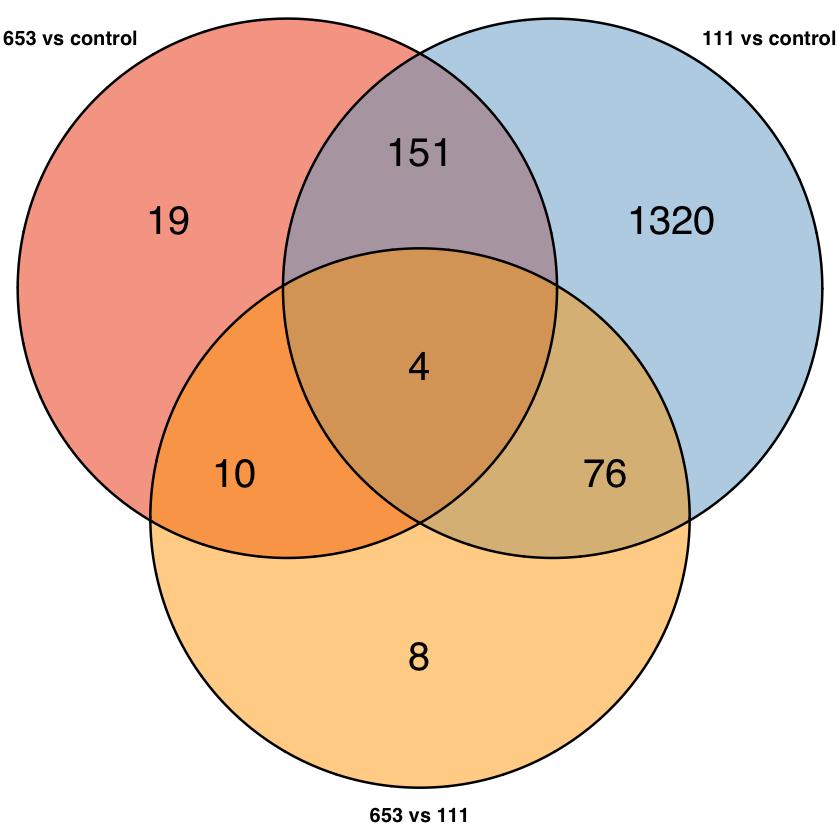

In [86]:
# tiff("/Users/davidwheeler/Desktop/RESEARCH/Data/TRANSCRIPTOMICS/FIGURES/Mint/Mint_VD.tiff",
#      width=9, height=9, units = 'in', res = 300)
venn.plot = venn.diagram(list(resSig_Cv653$id, resSig_Cv111$id, resSig_653v111$id),
            filename=NULL, 
            category.names=c("653 vs control", "111 vs control", "653 vs 111"),
            fill=c("orangered2","skyblue3","orange1"),
            alpha=c(0.5,0.5,0.5),
            cex=2,fontfamily = "sans",
            cat.cex=1, cat.fontface="bold", cat.fontfamily = "sans", 
            euler.d = TRUE, scaled = FALSE,
            height = 3000, width = 3000, 
            resolution = 500, imagetype = "tiff")

grid.draw(venn.plot)
# dev.off()

- Sanity checks

In [84]:
19+151+4+10 == length(resSig_Cv653$id)

[1] TRUE

In [85]:
1320+151+4+76 == length(resSig_Cv111$id)

[1] TRUE

In [86]:
8+10+4+76 == length(resSig_653v111$id)

[1] TRUE

In [6]:
4/(19+151+1320+10+4+76+8)*100

[1] 0.2518892

**Venn Diagram in Python**

In [ ]:
!pip install matplotlib-venn

In [ ]:
venn3(subsets = (19, 1320, 302, 8, 20, 152 ,12),
     set_labels = ('A', 'B', 'D'))
plt.figure(figsize=(20,20))
plt.show()

### Export data<a class="anchor" id="twelveth-q"></a>  
[Back to Table of Contents](#toc-q)

* Control vs. 653

In [128]:
?read.csv()

In [50]:
write.csv(as.data.frame(diffXGenes), 
          file="Mentha.csv")

* Control vs. 111

In [ ]:
write.csv(as.data.frame(resSig_Cv111), 
          file="Mentha_DEGs_Cv111.csv")

* 653 vs 111

In [ ]:
write.csv(as.data.frame(resSig_653v111), 
          file="Mentha_DEGs_653v111.csv")

### Graveyard<a class="anchor" id="thirteenth-q"></a>  
[Back to Table of Contents](#toc-q)

In [ ]:
# For each sample/row in the sample column
for (row in DF$Sample){
    # Split the sample by the underscore
    sample = strsplit(row,"_")
    # If sample contains S2, 
    if (grepl("S2",sample)){
    }
}

### Resources<a class="anchor" id="fourteenth-q"></a>  
[Back to Table of Contents](#toc-q)

 * R kernel installation: https://irkernel.github.io/installation/
 * DESeq2 installation: https://anaconda.org/bioconda/bioconductor-deseq2
 * DESeq2 data curation: https://www.bioconductor.org/packages/devel/bioc/vignettes/DEFormats/inst/doc/DEFormats.html
 * DESeq2 vignette: 
 http://bioconductor.org/packages/devel/bioc/vignettes/DESeq2/inst/doc/DESeq2.html
 http://master.bioconductor.org/packages/release/workflows/vignettes/rnaseqGene/inst/doc/rnaseqGene.html
 * Volcano plots: https://rdrr.io/github/kevinblighe/EnhancedVolcano/f/README.md
     * https://www.bioconductor.org/packages/release/bioc/vignettes/EnhancedVolcano/inst/doc/EnhancedVolcano.html
 